In [269]:
import pymc as pm
import pandas as pd
import numpy as np
import arviz as az
import matplotlib.pyplot as plt
import seaborn as sns


In [270]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [271]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Bayes final project/goalies.csv", index_col = 0)

In [272]:
df

,Player,GA,PKA,FK,CK,OG,PSxG+/-,/90,Cmp%,Thr,...,Min,GA90,SoTA,Saves,Save%,Squad,Weekly Wages (USD),Annual Wages (USD),League,Age
0,Julen Agirrezabala,6.0,0.0,0.0,0.0,0.0,-0.5,-0.06,36.6,33,...,675,0.80,19.0,13.0,68.4,Athletic Club,8832,459253,La Liga,21.0
1,Doğan Alemdar,8.0,1.0,0.0,2.0,0.0,-1.5,-0.32,34.3,14,...,406,1.77,16.0,7.0,56.3,Rennes,2734,142150,Ligue 1,19.0
2,Alisson,43.0,2.0,0.0,0.0,2.0,10.1,0.27,41.0,210,...,3330,1.16,147.0,105.0,72.1,Liverpool,190651,9913856,Premier League,29.0
3,Alphonse Areola,7.0,2.0,0.0,1.0,0.0,0.3,0.09,37.8,14,...,309,2.04,16.0,9.0,68.8,West Ham,152521,7931085,Premier League,29.0
4,Kepa Arrizabalaga,33.0,1.0,1.0,4.0,3.0,5.0,0.18,31.9,151,...,2565,1.16,120.0,90.0,73.3,Chelsea,190651,9913856,Premier League,27.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192,Axel Werner,4.0,0.0,0.0,2.0,0.0,-1.6,-0.82,20.0,9,...,180,2.00,8.0,4.0,50.0,Elche,4416,229627,La Liga,26.0
193,Robin Zentner,39.0,3.0,1.0,2.0,0.0,-3.6,-0.14,33.8,146,...,2340,1.50,109.0,69.0,67.0,Mainz 05,10935,568600,Bundesliga,27.0
194,Michael Zetterer,3.0,0.0,0.0,1.0,0.0,0.2,0.11,48.5,13,...,152,1.78,14.0,11.0,78.6,Werder Bremen,3154,164019,Bundesliga,27.0
195,Jeroen Zoet,4.0,1.0,0.0,1.0,0.0,-1.2,-0.31,32.1,13,...,334,1.08,13.0,9.0,76.9,Spezia,26916,1399630,Serie A,31.0


In [273]:
y = df['Annual Wages (USD)']
#plt.hist(np.log10(y))
log_y = np.log10(y)

In [274]:
X = df.drop(columns = ['Annual Wages (USD)', 'Weekly Wages (USD)', 'Player', 'Squad', 'PSxG+/-', 'Opp', 'Thr', 'SoTA', 'Saves', 'GA'])

In [275]:
X = pd.get_dummies(X, columns = ['League'], dtype = float)
X.T.head(26)

,0,1,2,3,4,5,6,7,8,9,...,187,188,189,190,191,192,193,194,195,196
PKA,0.00,1.00,2.00,2.00,1.00,1.00,5.00,7.00,2.00,1.00,...,1.00,0.00,4.00,3.00,2.00,0.00,3.00,0.00,1.00,0.00
FK,0.00,0.00,0.00,0.00,1.00,1.00,0.00,0.00,1.00,1.00,...,0.00,0.00,0.00,0.00,2.00,0.00,1.00,0.00,0.00,0.00
CK,0.00,2.00,0.00,1.00,4.00,0.00,4.00,4.00,11.00,7.00,...,3.00,1.00,8.00,6.00,6.00,2.00,2.00,1.00,1.00,0.00
OG,0.00,0.00,2.00,0.00,3.00,0.00,2.00,2.00,1.00,4.00,...,0.00,0.00,1.00,0.00,4.00,0.00,0.00,0.00,0.00,0.00
/90,-0.06,-0.32,0.27,0.09,0.18,-0.42,-0.19,0.24,-0.16,-0.52,...,-0.25,0.13,0.09,-0.09,-0.21,-0.82,-0.14,0.11,-0.31,-0.42
Cmp%,36.60,34.30,41.00,37.80,31.90,35.80,36.10,45.30,39.20,33.70,...,44.90,34.60,30.30,33.90,31.00,20.00,33.80,48.50,32.10,33.30
Launch%_Passes,29.60,38.50,18.40,39.30,17.10,38.80,45.80,33.80,35.30,50.20,...,41.40,20.50,33.50,34.70,29.70,32.10,50.00,51.00,54.50,47.80
AvgLen_GK,55.40,51.40,31.30,33.00,31.50,51.20,44.20,41.70,39.30,50.00,...,56.30,23.40,42.90,44.80,35.10,33.80,54.10,50.30,58.40,51.10
Stp%,11.50,6.70,5.80,4.30,4.50,3.00,6.70,3.70,8.10,7.90,...,0.00,5.90,5.60,3.10,5.60,3.80,13.40,20.00,6.50,4.20
#OPA/90,1.33,1.11,2.41,0.29,1.82,1.70,0.92,0.56,1.26,1.50,...,0.50,1.33,0.71,0.74,1.62,0.50,2.04,2.37,1.61,2.47


In [276]:
meany = np.mean(log_y)

## Pooled Model

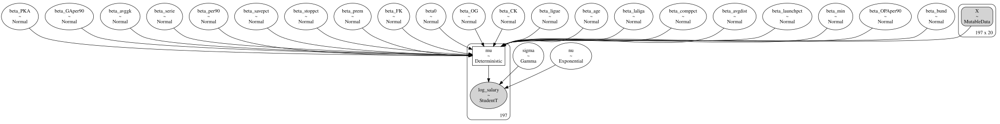

In [277]:

with pm.Model() as keeper_model:
    beta0 = pm.Normal('beta0', mu=meany, sigma=1)
    beta_PKA = pm.Normal('beta_PKA', mu=0, sigma=.01)
    beta_FK = pm.Normal('beta_FK', mu=0, sigma=.01)
    beta_CK = pm.Normal('beta_CK', mu=0, sigma=.01)
    beta_OG = pm.Normal('beta_OG', mu=0, sigma=.01)
    beta_per90 = pm.Normal('beta_per90', mu=0, sigma=.01)
    beta_comppct = pm.Normal('beta_comppct', mu=0, sigma=.01)
    beta_launchpct = pm.Normal('beta_launchpct', mu=0, sigma=.01)
    beta_avggk = pm.Normal('beta_avggk', mu=0, sigma=.01)
    beta_stoppct = pm.Normal('beta_stoppct', mu=0, sigma=.01)
    beta_OPAper90 = pm.Normal('beta_OPAper90', mu=0, sigma=.01)
    beta_avgdist = pm.Normal('beta_avgdist', mu=0, sigma=.01)
    beta_min = pm.Normal('beta_min', mu=0, sigma=.01)
    beta_GAper90 = pm.Normal('beta_GAper90', mu=0, sigma=.01)
    beta_savepct = pm.Normal('beta_savepct', mu=0, sigma=.01)
    beta_age = pm.Normal('beta_age', mu=0, sigma=.01)
    beta_bund = pm.Normal('beta_bund', mu=0, sigma=.01)
    beta_laliga = pm.Normal('beta_laliga', mu=0, sigma=.01)
    beta_ligue = pm.Normal('beta_ligue', mu=0, sigma=.01)
    beta_prem = pm.Normal('beta_prem', mu=0, sigma=.01)
    beta_serie = pm.Normal('beta_serie', mu=0, sigma=.01)


    X = pm.MutableData('X', X)

    nu = pm.Exponential('nu', 1/29.0)
    sigma = pm.Gamma('sigma', 2.0, 2.0)
    #sigma = pm.Uniform('sigma', 10**-5, 10)
    mu = pm.Deterministic("mu", beta0 + beta_PKA*X[:,0] + beta_FK*X[:,1] + beta_CK*X[:,2] + beta_OG*X[:,3]+ beta_per90*X[:,4] + beta_comppct*X[:,5]
                         + beta_launchpct*X[:,6] + beta_avggk*X[:,7]+ beta_stoppct*X[:,8] + beta_OPAper90*X[:,9]+ beta_avgdist*X[:,10] + beta_min*X[:,11]+ beta_GAper90*X[:,12] + beta_savepct*X[:,13]
                         + beta_age*X[:,14] + beta_bund*X[:,15]+ beta_laliga*X[:,16] + beta_ligue*X[:,17]+ beta_prem*X[:,18]+ beta_serie*X[:,19])

    log_salary = pm.StudentT('log_salary', mu = mu, sigma = sigma, observed = log_y, nu = nu)

    advi_fit = pm.fit(100000, method='advi', random_seed = 100)
    advi_samples = 5000
    pooled1_trace = advi_fit.sample(advi_samples, return_inferencedata=False)
    pooled1_trace = pm.to_inference_data(trace=pooled1_trace, model = keeper_model, log_likelihood=True)

pm.model_to_graphviz(keeper_model)


In [255]:
  #with keeper_model:
  #  pooled1_trace=pm.sample(random_seed = 100, cores = 4, idata_kwargs={'log_likelihood':True}, return_inferencedata=True)
  #  az.plot_trace(pooled1_trace, kind = "rank_bars")


In [256]:
#az.summary(pooled1_trace)


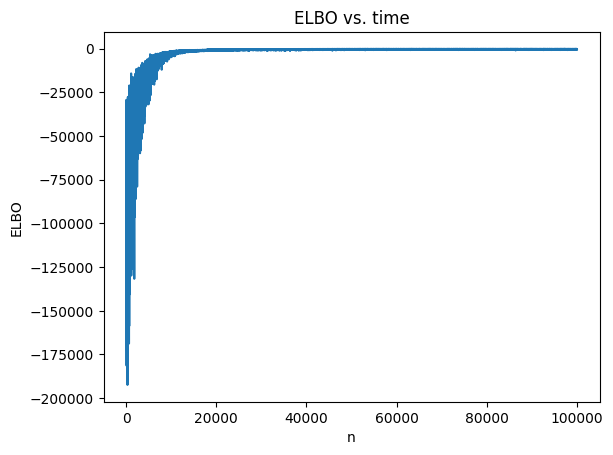

In [278]:
advi_elbo = pd.DataFrame(
    {'ELBO': -advi_fit.hist,
     'n': np.arange(advi_fit.hist.shape[0])})

plt.figure(dpi=100)
ax = sns.lineplot(y='ELBO', x='n', data=advi_elbo)
ax.set_title("ELBO vs. time")
plt.show()

<Axes: xlabel='log_salary / log_salary'>

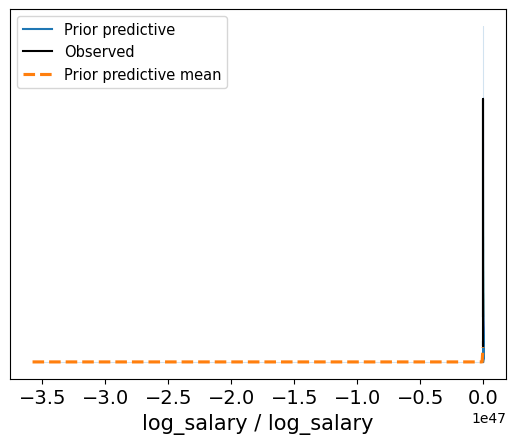

In [279]:
keeper_priorp = pm.sample_prior_predictive(500, model = keeper_model, return_inferencedata=True, random_seed=100)
az.plot_ppc(keeper_priorp, observed=True, group = 'prior')

<Axes: xlabel='log_salary / log_salary'>

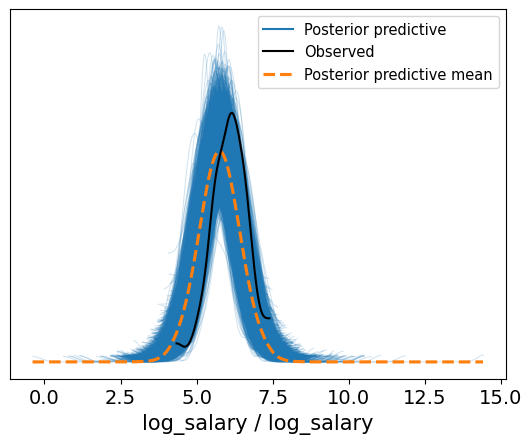

In [280]:
keeper_pp = pm.sample_posterior_predictive(pooled1_trace, model = keeper_model, random_seed=100)
az.plot_ppc(keeper_pp)

array([[<Axes: title={'center': 'beta0'}>,
        <Axes: title={'center': 'beta_PKA'}>,
        <Axes: title={'center': 'beta_FK'}>,
        <Axes: title={'center': 'beta_CK'}>],
       [<Axes: title={'center': 'beta_OG'}>,
        <Axes: title={'center': 'beta_per90'}>,
        <Axes: title={'center': 'beta_comppct'}>,
        <Axes: title={'center': 'beta_launchpct'}>],
       [<Axes: title={'center': 'beta_avggk'}>,
        <Axes: title={'center': 'beta_stoppct'}>,
        <Axes: title={'center': 'beta_OPAper90'}>,
        <Axes: title={'center': 'beta_avgdist'}>],
       [<Axes: title={'center': 'beta_min'}>,
        <Axes: title={'center': 'beta_GAper90'}>,
        <Axes: title={'center': 'beta_savepct'}>,
        <Axes: title={'center': 'beta_age'}>],
       [<Axes: title={'center': 'beta_bund'}>,
        <Axes: title={'center': 'beta_laliga'}>,
        <Axes: title={'center': 'beta_ligue'}>,
        <Axes: title={'center': 'beta_prem'}>],
       [<Axes: title={'center': 'beta_s

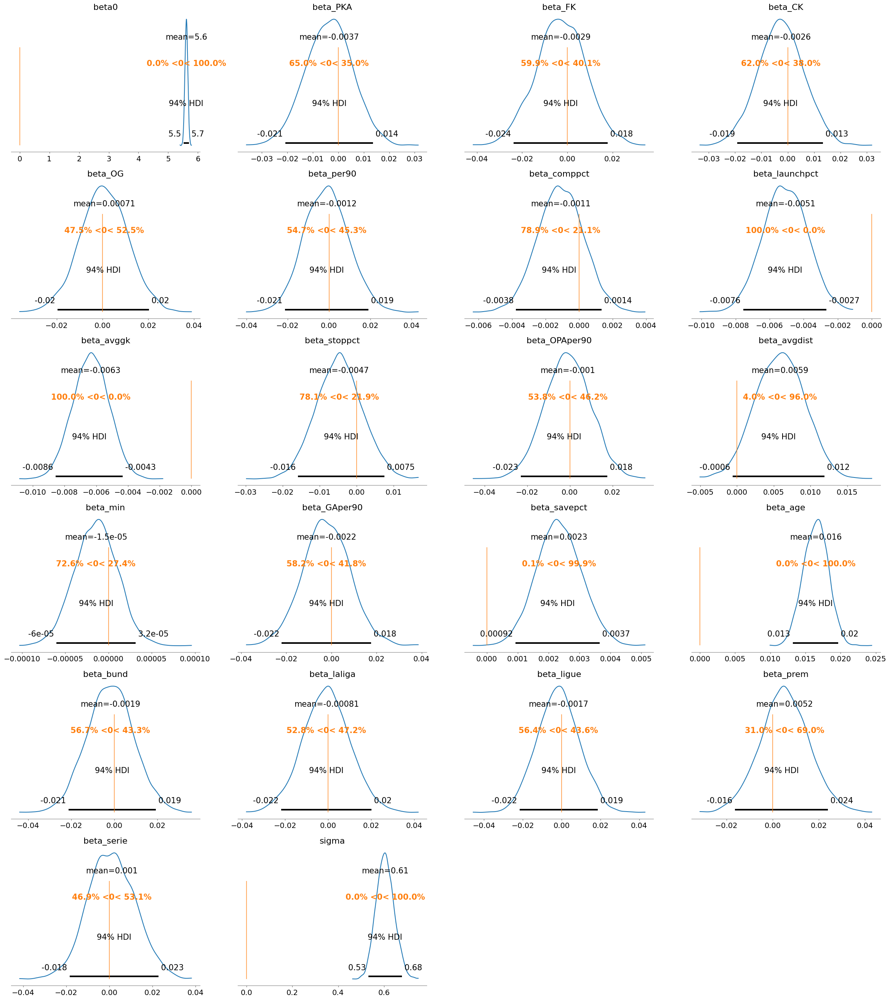

In [281]:
az.plot_posterior(pooled1_trace, ref_val = 0, var_names = [
'beta0',
'beta_PKA',
'beta_FK',
'beta_CK',
'beta_OG',
'beta_per90',
'beta_comppct',
'beta_launchpct',
'beta_avggk',
'beta_stoppct',
'beta_OPAper90',
'beta_avgdist',
'beta_min',
'beta_GAper90',
'beta_savepct',
'beta_age',
'beta_bund',
'beta_laliga',
'beta_ligue',
'beta_prem',
'beta_serie',
'sigma'])

## Unpooled

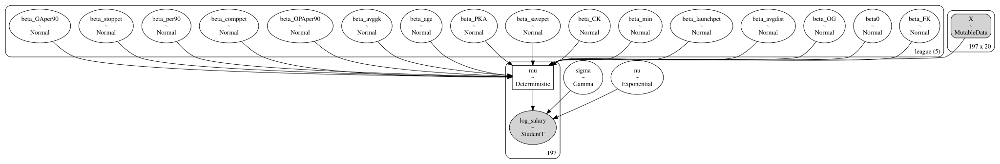

In [282]:
X = df.drop(columns = ['Annual Wages (USD)', 'Weekly Wages (USD)', 'Player', 'Squad', 'PSxG+/-', 'Opp', 'Thr', 'SoTA', 'Saves', 'GA'])
X = pd.get_dummies(X, columns = ['League'], dtype = float)
X = X.values
league, league_unique = df['League'].factorize()

coords = {'obs_id': df.index, 'league': league_unique}
with pm.Model(coords = coords) as unpooled_keeper_model:

    beta0 = pm.Normal('beta0', mu=meany, sigma=1, dims = ('league'))
    beta_PKA = pm.Normal('beta_PKA', mu=0, sigma=.01, dims = ('league'))
    beta_FK = pm.Normal('beta_FK', mu=0, sigma=.01, dims = ('league'))
    beta_CK = pm.Normal('beta_CK', mu=0, sigma=.01, dims = ('league'))
    beta_OG = pm.Normal('beta_OG', mu=0, sigma=.01, dims = ('league'))
    beta_per90 = pm.Normal('beta_per90', mu=0, sigma=.01, dims = ('league'))
    beta_comppct = pm.Normal('beta_comppct', mu=0, sigma=.01, dims = ('league'))
    beta_launchpct = pm.Normal('beta_launchpct', mu=0, sigma=.01, dims = ('league'))
    beta_avggk = pm.Normal('beta_avggk', mu=0, sigma=.01, dims = ('league'))
    beta_stoppct = pm.Normal('beta_stoppct', mu=0, sigma=.01, dims = ('league'))
    beta_OPAper90 = pm.Normal('beta_OPAper90', mu=0, sigma=.01, dims = ('league'))
    beta_avgdist = pm.Normal('beta_avgdist', mu=0, sigma=.01, dims = ('league') )
    beta_min = pm.Normal('beta_min', mu=0, sigma=.01, dims = ('league'))
    beta_GAper90 = pm.Normal('beta_GAper90', mu=0, sigma=.01, dims = ('league'))
    beta_savepct = pm.Normal('beta_savepct', mu=0, sigma=.01, dims = ('league'))
    beta_age = pm.Normal('beta_age', mu=0, sigma=.01, dims = ('league'))
    #beta_bund = pm.Normal('beta_bund', mu=0, sigma=.01, dims = ('league'))
    #beta_laliga = pm.Normal('beta_laliga', mu=0, sigma=.01, dims = ('league'))
    #beta_ligue = pm.Normal('beta_ligue', mu=0, sigma=.01, dims = ('league'))
    #beta_prem = pm.Normal('beta_prem', mu=0, sigma=.01, dims = ('league'))
    #beta_serie = pm.Normal('beta_serie', mu=0, sigma=.01, dims = ('league'))

    X = pm.MutableData('X', X)

    nu = pm.Exponential('nu', 1/29.0)
    sigma = pm.Gamma('sigma', 2.0, 2.0)
    #sigma = pm.Uniform('sigma', 10**-5, 10)

    mu = pm.Deterministic("mu", beta0[league] + beta_PKA[league]*X[:,0] + beta_FK[league]*X[:,1] + beta_CK[league]*X[:,2] + beta_OG[league]*X[:,3]+ beta_per90[league]*X[:,4] + beta_comppct[league]*X[:,5]
                         + beta_launchpct[league]*X[:,6] + beta_avggk[league]*X[:,7]+ beta_stoppct[league]*X[:,8] + beta_OPAper90[league]*X[:,9]+ beta_avgdist[league]*X[:,10] + beta_min[league]*X[:,11]+ beta_GAper90[league]*X[:,12] + beta_savepct[league]*X[:,13]
                         + beta_age[league]*X[:,14])

    log_salary = pm.StudentT('log_salary', mu = mu, sigma = sigma, observed = log_y, nu = nu)

    advi_fit = pm.fit(100000, method='advi', random_seed = 100)
    advi_samples = 5000
    unpooled1_trace = advi_fit.sample(advi_samples, return_inferencedata=False)
    unpooled1_trace = pm.to_inference_data(trace=unpooled1_trace, model = unpooled_keeper_model, log_likelihood=True)

pm.model_to_graphviz(unpooled_keeper_model)


In [ ]:
#with unpooled_keeper_model:
#  unpooled1_trace=pm.sample(random_seed = 100, cores = 2, idata_kwargs={'log_likelihood':True}, return_inferencedata=True)
#  az.plot_trace(unpooled1_trace, kind = "rank_bars")



In [ ]:
#az.summary(unpooled1_trace)

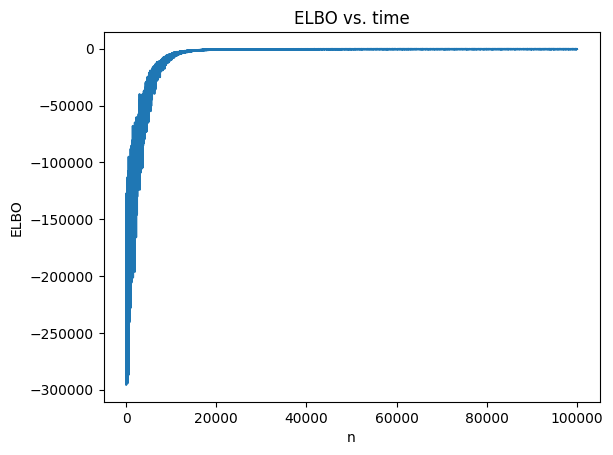

In [283]:
advi_elbo = pd.DataFrame(
    {'ELBO': -advi_fit.hist,
     'n': np.arange(advi_fit.hist.shape[0])})

plt.figure(dpi=100)
ax = sns.lineplot(y='ELBO', x='n', data=advi_elbo)
ax.set_title("ELBO vs. time")
plt.show()

<Axes: xlabel='log_salary / log_salary'>

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


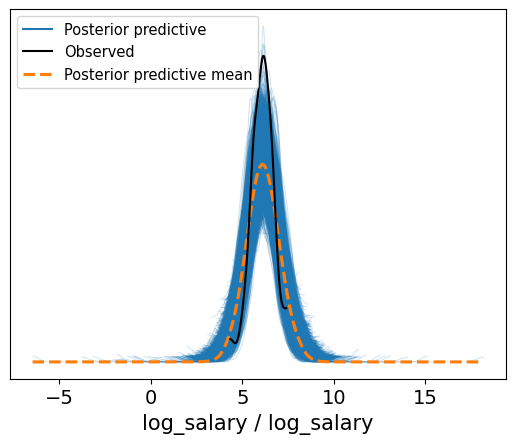

In [284]:
unpooled_keeper_pp = pm.sample_posterior_predictive(unpooled1_trace, model = unpooled_keeper_model, random_seed=100)
az.plot_ppc(unpooled_keeper_pp)

/usr/local/lib/python3.10/dist-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (100) is smaller than the number of variables to plot (279) in plot_posterior, generating only 100 plots
  warnings.warn(


array([[<Axes: title={'center': 'beta0\nLa Liga'}>,
        <Axes: title={'center': 'beta0\nLigue 1'}>,
        <Axes: title={'center': 'beta0\nPremier League'}>,
        <Axes: title={'center': 'beta0\nSerie A'}>],
       [<Axes: title={'center': 'beta0\nBundesliga'}>,
        <Axes: title={'center': 'beta_PKA\nLa Liga'}>,
        <Axes: title={'center': 'beta_PKA\nLigue 1'}>,
        <Axes: title={'center': 'beta_PKA\nPremier League'}>],
       [<Axes: title={'center': 'beta_PKA\nSerie A'}>,
        <Axes: title={'center': 'beta_PKA\nBundesliga'}>,
        <Axes: title={'center': 'beta_FK\nLa Liga'}>,
        <Axes: title={'center': 'beta_FK\nLigue 1'}>],
       [<Axes: title={'center': 'beta_FK\nPremier League'}>,
        <Axes: title={'center': 'beta_FK\nSerie A'}>,
        <Axes: title={'center': 'beta_FK\nBundesliga'}>,
        <Axes: title={'center': 'beta_CK\nLa Liga'}>],
       [<Axes: title={'center': 'beta_CK\nLigue 1'}>,
        <Axes: title={'center': 'beta_CK\nPremier Lea

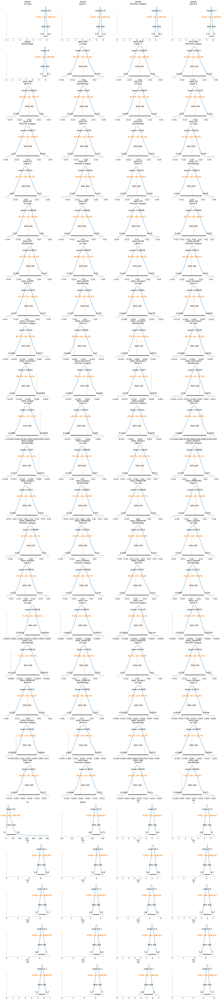

In [285]:
az.rcParams['plot.max_subplots'] = 100
az.plot_posterior(unpooled1_trace, ref_val = 0)

## Hierarchical Model

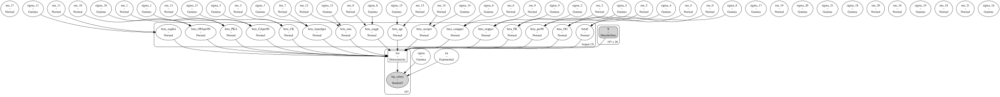

In [286]:
X = df.drop(columns = ['Annual Wages (USD)', 'Weekly Wages (USD)', 'Player', 'Squad', 'PSxG+/-', 'Opp', 'Thr', 'SoTA', 'Saves', 'GA'])
X = pd.get_dummies(X, columns = ['League'], dtype = float)
X = X.values
league, league_unique = df['League'].factorize()


coords = {'obs_id': df.index, 'league': league_unique}
with pm.Model(coords = coords) as hier_keeper_model:

    # hyperpriors
    mu_0 = pm.Normal('mu_0', mu = meany, sigma = 1)
    sigma_0 = pm.Gamma('sigma_0', .05 , 10)
    mu_1 = pm.Normal('mu_1', mu = 0, sigma = 0.1)
    sigma_1 = pm.Gamma('sigma_1', .05, 10)
    mu_2 = pm.Normal('mu_2', mu = 0, sigma = 0.1)
    sigma_2 = pm.Gamma('sigma_2', .05, 10)
    mu_3 = pm.Normal('mu_3', mu = 0, sigma = 0.1)
    sigma_3 = pm.Gamma('sigma_3',.05, 10)
    mu_4 = pm.Normal('mu_4', mu = 0, sigma = 0.1)
    sigma_4 = pm.Gamma('sigma_4', .05, 10)
    mu_5 = pm.Normal('mu_5', mu = 0, sigma = 0.1)
    sigma_5 = pm.Gamma('sigma_5', .05, 10)
    mu_6 = pm.Normal('mu_6', mu = 0, sigma = 0.1)
    sigma_6 = pm.Gamma('sigma_6',.05, 10)
    mu_7 = pm.Normal('mu_7', mu = 0, sigma = 0.1)
    sigma_7 = pm.Gamma('sigma_7', .05, 10)
    mu_8 = pm.Normal('mu_8', mu = 0, sigma = 0.1)
    sigma_8 = pm.Gamma('sigma_8', .05, 10)
    mu_9 = pm.Normal('mu_9', mu = 0, sigma = 0.1)
    sigma_9 = pm.Gamma('sigma_9', .05, 10)
    mu_10 = pm.Normal('mu_10', mu = 0, sigma = 0.1)
    sigma_10 = pm.Gamma('sigma_10', .05, 10)
    mu_11 = pm.Normal('mu_11', mu = 0, sigma = 0.1)
    sigma_11 = pm.Gamma('sigma_11', .05, 10)
    mu_12 = pm.Normal('mu_12', mu = 0, sigma = 0.1)
    sigma_12 = pm.Gamma('sigma_12', .05, 10)
    mu_13 = pm.Normal('mu_13', mu = 0, sigma = 0.1)
    sigma_13 = pm.Gamma('sigma_13', .05, 10)
    mu_14 = pm.Normal('mu_14', mu = 0, sigma = 0.1)
    sigma_14 = pm.Gamma('sigma_14', .05, 10)
    mu_15 = pm.Normal('mu_15', mu = 0, sigma = 0.1)
    sigma_15 = pm.Gamma('sigma_15', .05, 10)
    mu_16 = pm.Normal('mu_16', mu = 0, sigma = 0.1)
    sigma_16 = pm.Gamma('sigma_16', .05, 10)
    mu_17 = pm.Normal('mu_17', mu = 0, sigma = 0.1)
    sigma_17 = pm.Gamma('sigma_17', .05, 10)
    mu_18 = pm.Normal('mu_18', mu = 0, sigma = 0.1)
    sigma_18 = pm.Gamma('sigma_18', .05, 10)
    mu_19 = pm.Normal('mu_19', mu = 0, sigma = 0.1)
    sigma_19 = pm.Gamma('sigma_19', .05, 10)
    mu_20 = pm.Normal('mu_20', mu = 0, sigma = 0.1)
    sigma_20 = pm.Gamma('sigma_20', .05, 10)
    mu_21 = pm.Normal('mu_21', mu = 0, sigma = 0.1)
    sigma_21 = pm.Gamma('sigma_21', .05, 10)

    # priors
    beta0 = pm.Normal('beta0', mu=mu_0, sigma=sigma_0, dims = ('league'))
    beta_PKA = pm.Normal('beta_PKA', mu=mu_1, sigma=sigma_1, dims = ('league'))
    beta_FK = pm.Normal('beta_FK', mu=mu_2, sigma=sigma_2, dims = ('league'))
    beta_CK = pm.Normal('beta_CK', mu=mu_3, sigma=sigma_3, dims = ('league'))
    beta_OG = pm.Normal('beta_OG', mu=mu_4, sigma=sigma_4, dims = ('league'))
    beta_per90 = pm.Normal('beta_per90', mu=mu_5, sigma=sigma_5, dims = ('league'))
    beta_comppct = pm.Normal('beta_comppct', mu=mu_6, sigma=sigma_6, dims = ('league'))
    beta_launchpct = pm.Normal('beta_launchpct', mu=mu_7, sigma=sigma_7, dims = ('league'))
    beta_avggk = pm.Normal('beta_avggk', mu=mu_8, sigma=sigma_8, dims = ('league'))
    beta_stoppct = pm.Normal('beta_stoppct', mu=mu_9, sigma=sigma_9, dims = ('league'))
    beta_OPAper90 = pm.Normal('beta_OPAper90', mu=mu_10, sigma=sigma_10, dims = ('league'))
    beta_avgdist = pm.Normal('beta_avgdist', mu=mu_11, sigma=sigma_11, dims = ('league') )
    beta_min = pm.Normal('beta_min', mu=mu_12, sigma=sigma_12, dims = ('league'))
    beta_GAper90 = pm.Normal('beta_GAper90', mu=mu_13, sigma=sigma_13, dims = ('league'))
    beta_savepct = pm.Normal('beta_savepct', mu=mu_14, sigma=sigma_14, dims = ('league'))
    beta_age = pm.Normal('beta_age', mu=mu_15, sigma=sigma_15, dims = ('league'))


    X = pm.MutableData('X', X)

    nu = pm.Exponential('nu', 1/29.0)
    sigma = pm.Gamma('sigma', .5, 2)
    #sigma = pm.Uniform('sigma', 10**-5, 10)
    mu = pm.Deterministic("mu", beta0[league] + beta_PKA[league]*X[:,0] + beta_FK[league]*X[:,1] + beta_CK[league]*X[:,2] + beta_OG[league]*X[:,3]+ beta_per90[league]*X[:,4] + beta_comppct[league]*X[:,5]
                         + beta_launchpct[league]*X[:,6] + beta_avggk[league]*X[:,7]+ beta_stoppct[league]*X[:,8] + beta_OPAper90[league]*X[:,9]+ beta_avgdist[league]*X[:,10] + beta_min[league]*X[:,11]+ beta_GAper90[league]*X[:,12] + beta_savepct[league]*X[:,13]
                         + beta_age[league]*X[:,14])

    log_salary = pm.StudentT('log_salary', mu = mu, sigma = sigma, observed = log_y, nu = nu)

    #trace = pm.sample(1000, tune=1000, return_inferencedata=True)
    advi_fit = pm.fit(100000, method='advi', random_seed = 100)
    advi_samples = 5000
    hier1_trace = advi_fit.sample(advi_samples, return_inferencedata=False)

    hier1_trace = pm.to_inference_data(trace=hier1_trace, model = hier_keeper_model, log_likelihood=True)


pm.model_to_graphviz(hier_keeper_model)

In [ ]:
 #with hier_keeper_model:
 #   hier1_trace=pm.sample(random_seed = 100, cores = 2, idata_kwargs={'log_likelihood':True}, return_inferencedata=True)
 #   az.plot_trace(hier1_trace, kind = "rank_bars")

In [ ]:
#az.summary(hier1_trace)

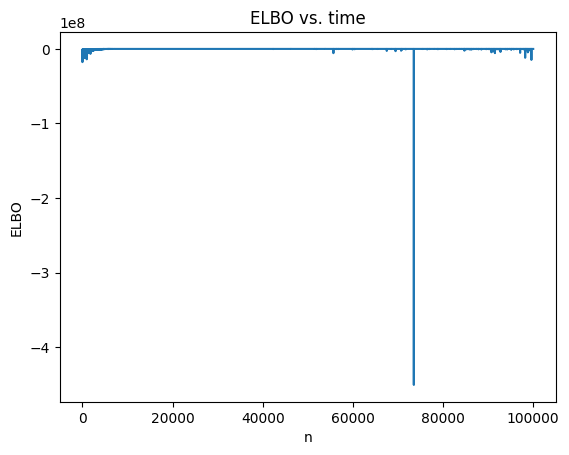

In [287]:
advi_elbo = pd.DataFrame(
    {'ELBO': -advi_fit.hist,
     'n': np.arange(advi_fit.hist.shape[0])})

plt.figure(dpi=100)
ax = sns.lineplot(y='ELBO', x='n', data=advi_elbo)
ax.set_title("ELBO vs. time")
plt.show()

<Axes: xlabel='log_salary / log_salary'>

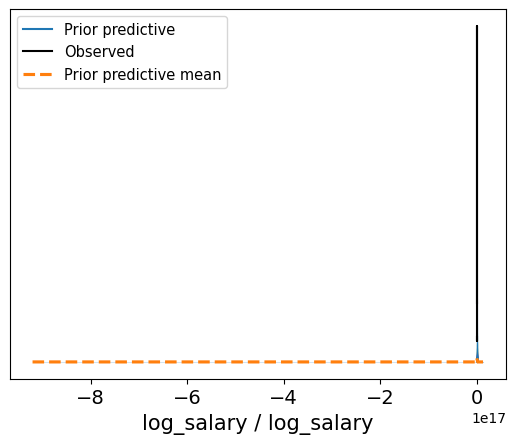

In [288]:
hier_keeper_priorp = pm.sample_prior_predictive(500, model = hier_keeper_model, return_inferencedata=True, random_seed=100)
az.plot_ppc(hier_keeper_priorp, group= "prior")

<Axes: xlabel='log_salary / log_salary'>

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


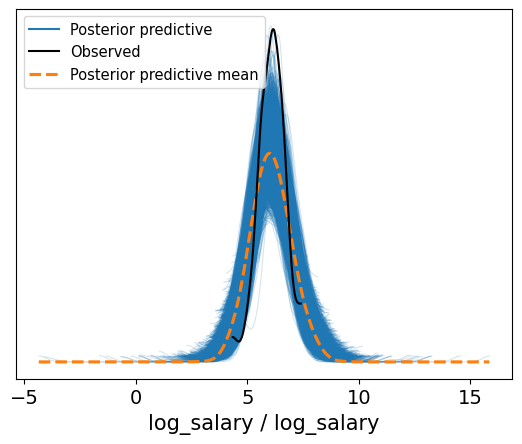

In [289]:
hier_keeper_pp = pm.sample_posterior_predictive(hier1_trace, model = hier_keeper_model, random_seed=100)
az.plot_ppc(hier_keeper_pp)

/usr/local/lib/python3.10/dist-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (100) is smaller than the number of variables to plot (323) in plot_posterior, generating only 100 plots
  warnings.warn(


array([[<Axes: title={'center': 'mu_0'}>,
        <Axes: title={'center': 'mu_1'}>,
        <Axes: title={'center': 'mu_2'}>,
        <Axes: title={'center': 'mu_3'}>],
       [<Axes: title={'center': 'mu_4'}>,
        <Axes: title={'center': 'mu_5'}>,
        <Axes: title={'center': 'mu_6'}>,
        <Axes: title={'center': 'mu_7'}>],
       [<Axes: title={'center': 'mu_8'}>,
        <Axes: title={'center': 'mu_9'}>,
        <Axes: title={'center': 'mu_10'}>,
        <Axes: title={'center': 'mu_11'}>],
       [<Axes: title={'center': 'mu_12'}>,
        <Axes: title={'center': 'mu_13'}>,
        <Axes: title={'center': 'mu_14'}>,
        <Axes: title={'center': 'mu_15'}>],
       [<Axes: title={'center': 'mu_16'}>,
        <Axes: title={'center': 'mu_17'}>,
        <Axes: title={'center': 'mu_18'}>,
        <Axes: title={'center': 'mu_19'}>],
       [<Axes: title={'center': 'mu_20'}>,
        <Axes: title={'center': 'mu_21'}>,
        <Axes: title={'center': 'beta0\nLa Liga'}>,
       

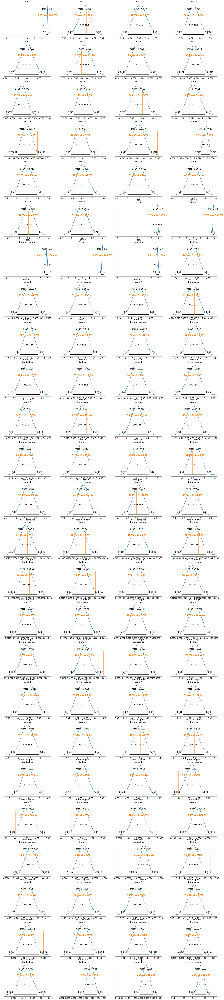

In [290]:
az.rcParams['plot.max_subplots'] = 100
az.plot_posterior(hier1_trace, ref_val = 0)

In [291]:
az.compare({'pooled': pooled1_trace, 'unpooled': unpooled1_trace, 'hierarchical': hier1_trace}, ic = 'loo')

/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
pooled,0,-199.027821,15.115767,0.000000,0.564410,9.184417,0.000000,False,log
unpooled,1,-213.710651,39.464719,14.682830,0.166876,8.037669,9.610491,True,log
hierarchical,2,-215.763547,44.944755,16.735726,0.268714,10.040264,11.113241,True,log


In [292]:
az.compare({'pooled': pooled1_trace, 'unpooled': unpooled1_trace, 'hierarchical': hier1_trace}, ic = 'waic')

/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
pooled,0,-198.829777,14.917723,0.000000,0.536933,9.159158,0.000000,True,log
unpooled,1,-211.434336,37.188405,12.604559,0.177989,7.808487,9.469121,True,log
hierarchical,2,-212.710311,41.891519,13.880534,0.285078,9.696444,10.832506,True,log


# **START OF TRANSFORMED MODELS**

In [294]:
import pymc as pm
import pandas as pd
import numpy as np
import arviz as az
import matplotlib.pyplot as plt
import seaborn as sns


In [139]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [295]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Bayes final project/goalies.csv", index_col = 0)

In [296]:
df

,Player,GA,PKA,FK,CK,OG,PSxG+/-,/90,Cmp%,Thr,...,Min,GA90,SoTA,Saves,Save%,Squad,Weekly Wages (USD),Annual Wages (USD),League,Age
0,Julen Agirrezabala,6.0,0.0,0.0,0.0,0.0,-0.5,-0.06,36.6,33,...,675,0.80,19.0,13.0,68.4,Athletic Club,8832,459253,La Liga,21.0
1,Doğan Alemdar,8.0,1.0,0.0,2.0,0.0,-1.5,-0.32,34.3,14,...,406,1.77,16.0,7.0,56.3,Rennes,2734,142150,Ligue 1,19.0
2,Alisson,43.0,2.0,0.0,0.0,2.0,10.1,0.27,41.0,210,...,3330,1.16,147.0,105.0,72.1,Liverpool,190651,9913856,Premier League,29.0
3,Alphonse Areola,7.0,2.0,0.0,1.0,0.0,0.3,0.09,37.8,14,...,309,2.04,16.0,9.0,68.8,West Ham,152521,7931085,Premier League,29.0
4,Kepa Arrizabalaga,33.0,1.0,1.0,4.0,3.0,5.0,0.18,31.9,151,...,2565,1.16,120.0,90.0,73.3,Chelsea,190651,9913856,Premier League,27.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192,Axel Werner,4.0,0.0,0.0,2.0,0.0,-1.6,-0.82,20.0,9,...,180,2.00,8.0,4.0,50.0,Elche,4416,229627,La Liga,26.0
193,Robin Zentner,39.0,3.0,1.0,2.0,0.0,-3.6,-0.14,33.8,146,...,2340,1.50,109.0,69.0,67.0,Mainz 05,10935,568600,Bundesliga,27.0
194,Michael Zetterer,3.0,0.0,0.0,1.0,0.0,0.2,0.11,48.5,13,...,152,1.78,14.0,11.0,78.6,Werder Bremen,3154,164019,Bundesliga,27.0
195,Jeroen Zoet,4.0,1.0,0.0,1.0,0.0,-1.2,-0.31,32.1,13,...,334,1.08,13.0,9.0,76.9,Spezia,26916,1399630,Serie A,31.0


In [297]:
df['Min'] = np.log10(df['Min'])
df['Age'] = np.log10(df['Age'])

In [298]:
y = df['Annual Wages (USD)']
#plt.hist(np.log10(y))
log_y = np.log10(y)

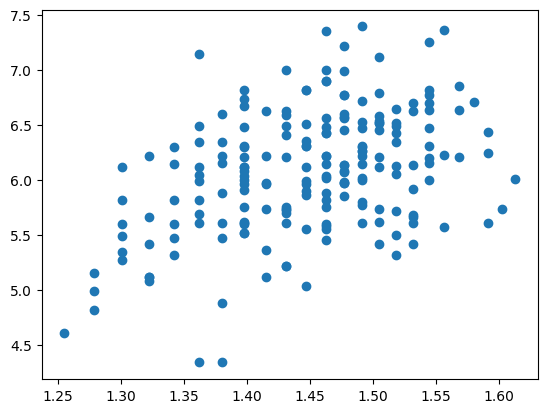

In [299]:
plt.scatter(df['Age'], log_y)

In [300]:
X = df.drop(columns = ['Annual Wages (USD)', 'Weekly Wages (USD)', 'Player', 'Squad', 'PSxG+/-', 'Opp', 'Thr', 'SoTA', 'Saves', 'GA'])

In [301]:
X = pd.get_dummies(X, columns = ['League'], dtype = float)
X.T.head(26)

,0,1,2,3,4,5,6,7,8,9,...,187,188,189,190,191,192,193,194,195,196
PKA,0.000000,1.000000,2.000000,2.000000,1.000000,1.000000,5.000000,7.000000,2.000000,1.000000,...,1.000000,0.000000,4.000000,3.000000,2.000000,0.000000,3.000000,0.000000,1.000000,0.000000
FK,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000
CK,0.000000,2.000000,0.000000,1.000000,4.000000,0.000000,4.000000,4.000000,11.000000,7.000000,...,3.000000,1.000000,8.000000,6.000000,6.000000,2.000000,2.000000,1.000000,1.000000,0.000000
OG,0.000000,0.000000,2.000000,0.000000,3.000000,0.000000,2.000000,2.000000,1.000000,4.000000,...,0.000000,0.000000,1.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000
/90,-0.060000,-0.320000,0.270000,0.090000,0.180000,-0.420000,-0.190000,0.240000,-0.160000,-0.520000,...,-0.250000,0.130000,0.090000,-0.090000,-0.210000,-0.820000,-0.140000,0.110000,-0.310000,-0.420000
Cmp%,36.600000,34.300000,41.000000,37.800000,31.900000,35.800000,36.100000,45.300000,39.200000,33.700000,...,44.900000,34.600000,30.300000,33.900000,31.000000,20.000000,33.800000,48.500000,32.100000,33.300000
Launch%_Passes,29.600000,38.500000,18.400000,39.300000,17.100000,38.800000,45.800000,33.800000,35.300000,50.200000,...,41.400000,20.500000,33.500000,34.700000,29.700000,32.100000,50.000000,51.000000,54.500000,47.800000
AvgLen_GK,55.400000,51.400000,31.300000,33.000000,31.500000,51.200000,44.200000,41.700000,39.300000,50.000000,...,56.300000,23.400000,42.900000,44.800000,35.100000,33.800000,54.100000,50.300000,58.400000,51.100000
Stp%,11.500000,6.700000,5.800000,4.300000,4.500000,3.000000,6.700000,3.700000,8.100000,7.900000,...,0.000000,5.900000,5.600000,3.100000,5.600000,3.800000,13.400000,20.000000,6.500000,4.200000
#OPA/90,1.330000,1.110000,2.410000,0.290000,1.820000,1.700000,0.920000,0.560000,1.260000,1.500000,...,0.500000,1.330000,0.710000,0.740000,1.620000,0.500000,2.040000,2.370000,1.610000,2.470000


In [302]:
meany = np.mean(log_y)

## Pooled Model

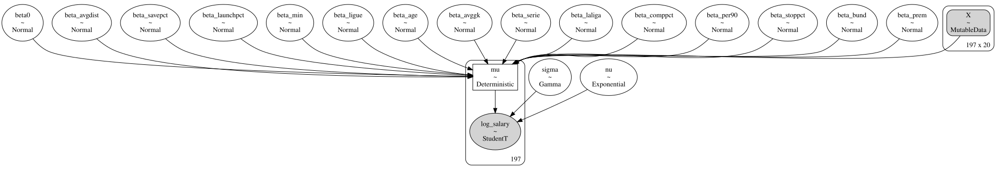

In [303]:

with pm.Model() as keeper_model_2:
    beta0 = pm.Normal('beta0', mu=meany, sigma=1)
    #beta_PKA = pm.Normal('beta_PKA', mu=0, sigma=.01)
    #beta_FK = pm.Normal('beta_FK', mu=0, sigma=.01)
    #beta_CK = pm.Normal('beta_CK', mu=0, sigma=.01)
    #beta_OG = pm.Normal('beta_OG', mu=0, sigma=.01)
    beta_per90 = pm.Normal('beta_per90', mu=0, sigma=.01)
    beta_comppct = pm.Normal('beta_comppct', mu=0, sigma=.01)
    beta_launchpct = pm.Normal('beta_launchpct', mu=0, sigma=.01)
    beta_avggk = pm.Normal('beta_avggk', mu=0, sigma=.01)
    beta_stoppct = pm.Normal('beta_stoppct', mu=0, sigma=.01)
    #beta_OPAper90 = pm.Normal('beta_OPAper90', mu=0, sigma=.01)
    beta_avgdist = pm.Normal('beta_avgdist', mu=0, sigma=.01)
    beta_min = pm.Normal('beta_min', mu=0, sigma=.01)
    #beta_GAper90 = pm.Normal('beta_GAper90', mu=0, sigma=.01)
    beta_savepct = pm.Normal('beta_savepct', mu=0, sigma=.01)
    beta_age = pm.Normal('beta_age', mu=0, sigma=.01)
    beta_bund = pm.Normal('beta_bund', mu=0, sigma=.01)
    beta_laliga = pm.Normal('beta_laliga', mu=0, sigma=.01)
    beta_ligue = pm.Normal('beta_ligue', mu=0, sigma=.01)
    beta_prem = pm.Normal('beta_prem', mu=0, sigma=.01)
    beta_serie = pm.Normal('beta_serie', mu=0, sigma=.01)


    X = pm.MutableData('X', X)

    nu = pm.Exponential('nu', 1/29.0)
    sigma = pm.Gamma('sigma', 2.0, 2.0)
    #sigma = pm.Uniform('sigma', 10**-5, 10)
    mu = pm.Deterministic("mu", beta0 + beta_per90*X[:,4] + beta_comppct*X[:,5]
                         + beta_launchpct*X[:,6] + beta_avggk*X[:,7]+ beta_stoppct*X[:,8] + beta_avgdist*X[:,10] + beta_min*X[:,11] + beta_savepct*X[:,13]
                         + beta_age*X[:,14] + beta_bund*X[:,15]+ beta_laliga*X[:,16] + beta_ligue*X[:,17]+ beta_prem*X[:,18]+ beta_serie*X[:,19])

    log_salary = pm.StudentT('log_salary', mu = mu, sigma = sigma, observed = log_y, nu = nu)

    #trace = pm.sample(1000, tune=1000, return_inferencedata=True)
    advi_fit = pm.fit(100000, method='advi', random_seed = 100)
    advi_samples = 5000
    pooled2_trace = advi_fit.sample(advi_samples, return_inferencedata=False)
    pooled2_trace = pm.to_inference_data(trace=pooled2_trace, model = keeper_model_2, log_likelihood=True)

pm.model_to_graphviz(keeper_model_2)


In [304]:
 #with keeper_model_2:
 #   pooled2_trace=pm.sample(random_seed = 100, cores = 2, idata_kwargs={'log_likelihood':True}, return_inferencedata=True)
 #   az.plot_trace(pooled2_trace, kind = "rank_bars")

In [305]:
#az.summary(pooled2_trace)

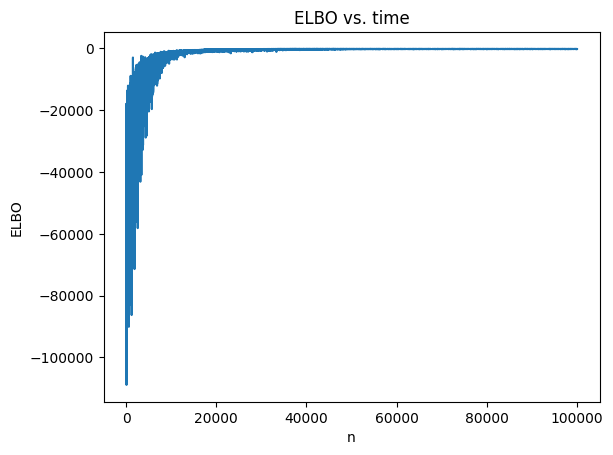

In [306]:
advi_elbo = pd.DataFrame(
    {'ELBO': -advi_fit.hist,
     'n': np.arange(advi_fit.hist.shape[0])})

plt.figure(dpi=100)
ax = sns.lineplot(y='ELBO', x='n', data=advi_elbo)
ax.set_title("ELBO vs. time")
plt.show()

<Axes: xlabel='log_salary / log_salary'>

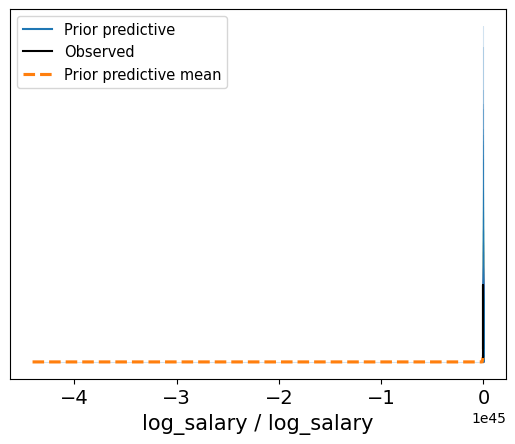

In [307]:
keeper_priorp = pm.sample_prior_predictive(500, model = keeper_model_2, return_inferencedata=True, random_seed=100)
az.plot_ppc(keeper_priorp, observed=True, group = 'prior')

<Axes: xlabel='log_salary / log_salary'>

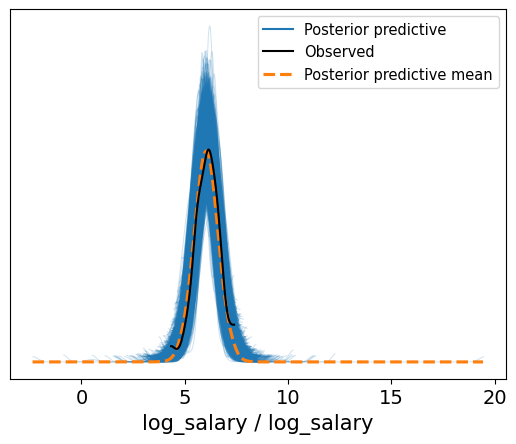

In [308]:
keeper_pp = pm.sample_posterior_predictive(pooled2_trace, model = keeper_model_2, random_seed=100)
az.plot_ppc(keeper_pp)

array([[<Axes: title={'center': 'beta0'}>,
        <Axes: title={'center': 'beta_per90'}>,
        <Axes: title={'center': 'beta_comppct'}>,
        <Axes: title={'center': 'beta_launchpct'}>],
       [<Axes: title={'center': 'beta_avggk'}>,
        <Axes: title={'center': 'beta_stoppct'}>,
        <Axes: title={'center': 'beta_avgdist'}>,
        <Axes: title={'center': 'beta_min'}>],
       [<Axes: title={'center': 'beta_savepct'}>,
        <Axes: title={'center': 'beta_age'}>,
        <Axes: title={'center': 'beta_bund'}>,
        <Axes: title={'center': 'beta_laliga'}>],
       [<Axes: title={'center': 'beta_ligue'}>,
        <Axes: title={'center': 'beta_prem'}>,
        <Axes: title={'center': 'beta_serie'}>,
        <Axes: title={'center': 'sigma'}>]], dtype=object)

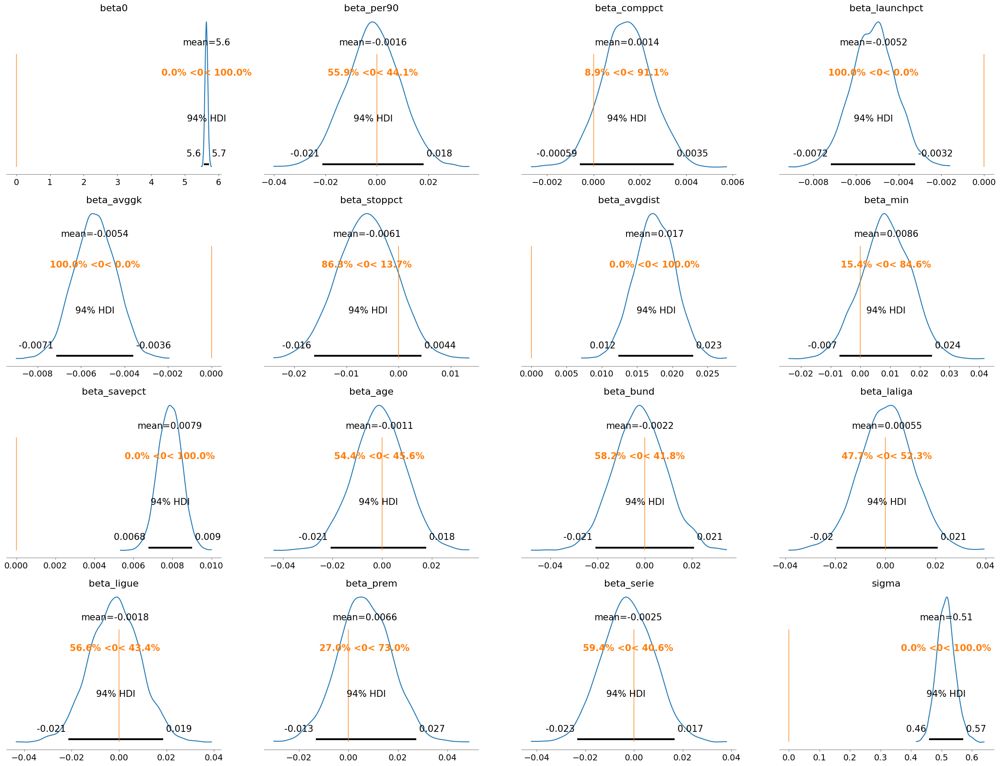

In [309]:
az.plot_posterior(pooled2_trace, ref_val = 0, var_names = [
'beta0',
'beta_per90',
'beta_comppct',
'beta_launchpct',
'beta_avggk',
'beta_stoppct',
'beta_avgdist',
'beta_min',
'beta_savepct',
'beta_age',
'beta_bund',
'beta_laliga',
'beta_ligue',
'beta_prem',
'beta_serie',
'sigma'])

## Unpooled

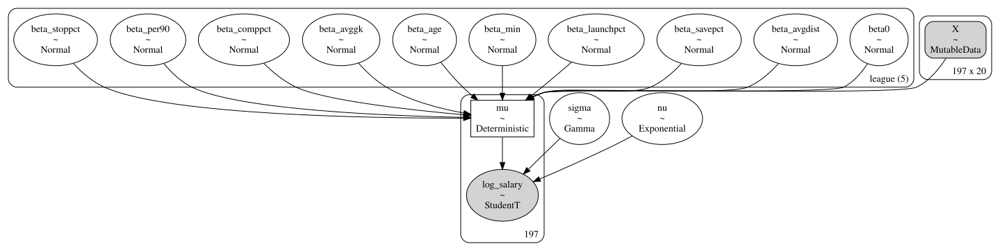

In [310]:
X = df.drop(columns = ['Annual Wages (USD)', 'Weekly Wages (USD)', 'Player', 'Squad', 'PSxG+/-', 'Opp', 'Thr', 'SoTA', 'Saves', 'GA'])
X = pd.get_dummies(X, columns = ['League'], dtype = float)
X = X.values
league, league_unique = df['League'].factorize()

coords = {'obs_id': df.index, 'league': league_unique}
with pm.Model(coords = coords) as unpooled_keeper_model_2:

    beta0 = pm.Normal('beta0', mu=meany, sigma=1, dims = ('league'))
    #beta_PKA = pm.Normal('beta_PKA', mu=0, sigma=.01, dims = ('league'))
    #beta_FK = pm.Normal('beta_FK', mu=0, sigma=.01, dims = ('league'))
    #beta_CK = pm.Normal('beta_CK', mu=0, sigma=.01, dims = ('league'))
    #beta_OG = pm.Normal('beta_OG', mu=0, sigma=.01, dims = ('league'))
    beta_per90 = pm.Normal('beta_per90', mu=0, sigma=.01, dims = ('league'))
    beta_comppct = pm.Normal('beta_comppct', mu=0, sigma=.01, dims = ('league'))
    beta_launchpct = pm.Normal('beta_launchpct', mu=0, sigma=.01, dims = ('league'))
    beta_avggk = pm.Normal('beta_avggk', mu=0, sigma=.01, dims = ('league'))
    beta_stoppct = pm.Normal('beta_stoppct', mu=0, sigma=.01, dims = ('league'))
    #beta_OPAper90 = pm.Normal('beta_OPAper90', mu=0, sigma=.01, dims = ('league'))
    beta_avgdist = pm.Normal('beta_avgdist', mu=0, sigma=.01, dims = ('league') )
    beta_min = pm.Normal('beta_min', mu=0, sigma=.01, dims = ('league'))
    #beta_GAper90 = pm.Normal('beta_GAper90', mu=0, sigma=.01, dims = ('league'))
    beta_savepct = pm.Normal('beta_savepct', mu=0, sigma=.01, dims = ('league'))
    beta_age = pm.Normal('beta_age', mu=0, sigma=.01, dims = ('league'))
    #beta_bund = pm.Normal('beta_bund', mu=0, sigma=.01, dims = ('league'))
    #beta_laliga = pm.Normal('beta_laliga', mu=0, sigma=.01, dims = ('league'))
    #beta_ligue = pm.Normal('beta_ligue', mu=0, sigma=.01, dims = ('league'))
    #beta_prem = pm.Normal('beta_prem', mu=0, sigma=.01, dims = ('league'))
    #beta_serie = pm.Normal('beta_serie', mu=0, sigma=.01, dims = ('league'))

    X = pm.MutableData('X', X)

    nu = pm.Exponential('nu', 1/29.0)
    sigma = pm.Gamma('sigma', 2.0, 2.0)
    #sigma = pm.Uniform('sigma', 10**-5, 10)

    mu = pm.Deterministic("mu", beta0[league] + beta_per90[league]*X[:,4] + beta_comppct[league]*X[:,5]
                         + beta_launchpct[league]*X[:,6] + beta_avggk[league]*X[:,7]+ beta_stoppct[league]*X[:,8] + beta_avgdist[league]*X[:,10] + beta_min[league]*X[:,11]+ beta_savepct[league]*X[:,13]
                         + beta_age[league]*X[:,14])

    log_salary = pm.StudentT('log_salary', mu = mu, sigma = sigma, observed = log_y, nu = nu)

    #trace = pm.sample(1000, tune=1000, return_inferencedata=True)
    advi_fit = pm.fit(100000, method='advi', random_seed = 100)
    advi_samples = 5000
    unpooled2_trace = advi_fit.sample(advi_samples, return_inferencedata=False)
    unpooled2_trace = pm.to_inference_data(trace=unpooled2_trace, model = unpooled_keeper_model_2, log_likelihood=True)

pm.model_to_graphviz(unpooled_keeper_model_2)


In [311]:
 #with unpooled_keeper_model_2:
 #   unpooled2_trace=pm.sample(random_seed = 100, cores = 2, idata_kwargs={'log_likelihood':True}, return_inferencedata=True)
 #   az.plot_trace(unpooled1_trace, kind = "rank_bars")

In [312]:
#az.summary(unpooled2_trace)

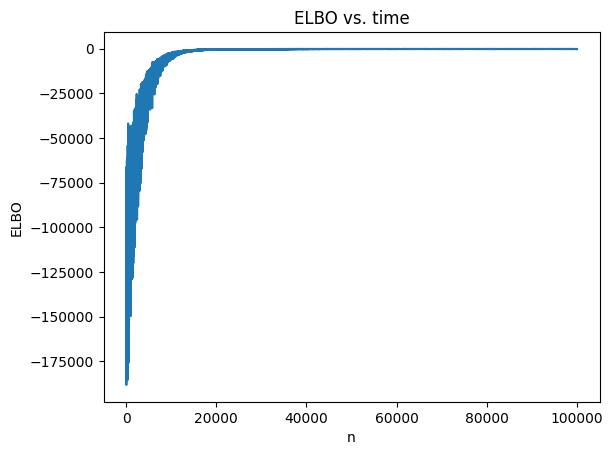

In [313]:
advi_elbo = pd.DataFrame(
    {'ELBO': -advi_fit.hist,
     'n': np.arange(advi_fit.hist.shape[0])})

plt.figure(dpi=100)
ax = sns.lineplot(y='ELBO', x='n', data=advi_elbo)
ax.set_title("ELBO vs. time")
plt.show()

<Axes: xlabel='log_salary / log_salary'>

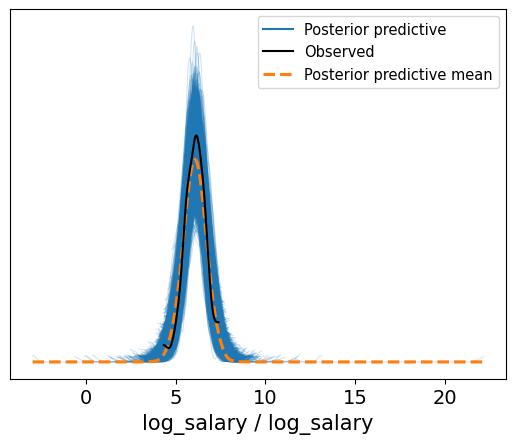

In [314]:
unpooled_keeper_pp = pm.sample_posterior_predictive(unpooled2_trace, model = unpooled_keeper_model_2, random_seed=100)
az.plot_ppc(unpooled_keeper_pp)

/usr/local/lib/python3.10/dist-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (100) is smaller than the number of variables to plot (249) in plot_posterior, generating only 100 plots
  warnings.warn(


array([[<Axes: title={'center': 'beta0\nLa Liga'}>,
        <Axes: title={'center': 'beta0\nLigue 1'}>,
        <Axes: title={'center': 'beta0\nPremier League'}>,
        <Axes: title={'center': 'beta0\nSerie A'}>],
       [<Axes: title={'center': 'beta0\nBundesliga'}>,
        <Axes: title={'center': 'beta_per90\nLa Liga'}>,
        <Axes: title={'center': 'beta_per90\nLigue 1'}>,
        <Axes: title={'center': 'beta_per90\nPremier League'}>],
       [<Axes: title={'center': 'beta_per90\nSerie A'}>,
        <Axes: title={'center': 'beta_per90\nBundesliga'}>,
        <Axes: title={'center': 'beta_comppct\nLa Liga'}>,
        <Axes: title={'center': 'beta_comppct\nLigue 1'}>],
       [<Axes: title={'center': 'beta_comppct\nPremier League'}>,
        <Axes: title={'center': 'beta_comppct\nSerie A'}>,
        <Axes: title={'center': 'beta_comppct\nBundesliga'}>,
        <Axes: title={'center': 'beta_launchpct\nLa Liga'}>],
       [<Axes: title={'center': 'beta_launchpct\nLigue 1'}>,
    

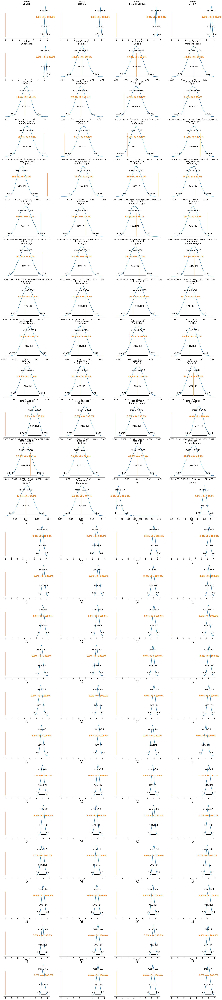

In [315]:
az.rcParams['plot.max_subplots'] = 100
az.plot_posterior(unpooled2_trace, ref_val = 0)

## Hierarchical Model

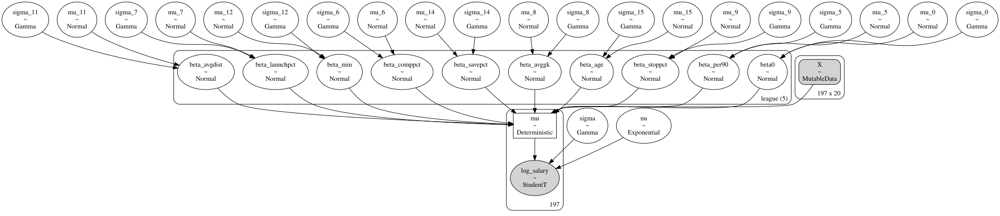

In [316]:
X = df.drop(columns = ['Annual Wages (USD)', 'Weekly Wages (USD)', 'Player', 'Squad', 'PSxG+/-', 'Opp', 'Thr', 'SoTA', 'Saves', 'GA'])
X = pd.get_dummies(X, columns = ['League'], dtype = float)
X = X.values
league, league_unique = df['League'].factorize()


coords = {'obs_id': df.index, 'league': league_unique}
with pm.Model(coords = coords) as hier_keeper_model_2:

    # hyperpriors
    mu_0 = pm.Normal('mu_0', mu = meany, sigma = 1)
    sigma_0 = pm.Gamma('sigma_0', .05 , 10)
    #mu_1 = pm.Normal('mu_1', mu = 0, sigma = 0.1)
    #sigma_1 = pm.Gamma('sigma_1', .05, 10)
    #mu_2 = pm.Normal('mu_2', mu = 0, sigma = 0.1)
    #sigma_2 = pm.Gamma('sigma_2', .05, 10)
    #mu_3 = pm.Normal('mu_3', mu = 0, sigma = 0.1)
    #sigma_3 = pm.Gamma('sigma_3',.05, 10)
    #mu_4 = pm.Normal('mu_4', mu = 0, sigma = 0.1)
    #sigma_4 = pm.Gamma('sigma_4', .05, 10)
    mu_5 = pm.Normal('mu_5', mu = 0, sigma = 0.1)
    sigma_5 = pm.Gamma('sigma_5', .05, 10)
    mu_6 = pm.Normal('mu_6', mu = 0, sigma = 0.1)
    sigma_6 = pm.Gamma('sigma_6',.05, 10)
    mu_7 = pm.Normal('mu_7', mu = 0, sigma = 0.1)
    sigma_7 = pm.Gamma('sigma_7', .05, 10)
    mu_8 = pm.Normal('mu_8', mu = 0, sigma = 0.1)
    sigma_8 = pm.Gamma('sigma_8', .05, 10)
    mu_9 = pm.Normal('mu_9', mu = 0, sigma = 0.1)
    sigma_9 = pm.Gamma('sigma_9', .05, 10)
    #mu_10 = pm.Normal('mu_10', mu = 0, sigma = 0.1)
    #sigma_10 = pm.Gamma('sigma_10', .05, 10)
    mu_11 = pm.Normal('mu_11', mu = 0, sigma = 0.1)
    sigma_11 = pm.Gamma('sigma_11', .05, 10)
    mu_12 = pm.Normal('mu_12', mu = 0, sigma = 0.1)
    sigma_12 = pm.Gamma('sigma_12', .05, 10)
    #mu_13 = pm.Normal('mu_13', mu = 0, sigma = 0.1)
    #sigma_13 = pm.Gamma('sigma_13', .05, 10)
    mu_14 = pm.Normal('mu_14', mu = 0, sigma = 0.1)
    sigma_14 = pm.Gamma('sigma_14', .05, 10)
    mu_15 = pm.Normal('mu_15', mu = 0, sigma = 0.1)
    sigma_15 = pm.Gamma('sigma_15', .05, 10)
    #mu_16 = pm.Normal('mu_16', mu = 0, sigma = 0.1)
    #sigma_16 = pm.Gamma('sigma_16', .05, 10)
    #mu_17 = pm.Normal('mu_17', mu = 0, sigma = 0.1)
    #sigma_17 = pm.Gamma('sigma_17', .05, 10)
    #mu_18 = pm.Normal('mu_18', mu = 0, sigma = 0.1)
    #sigma_18 = pm.Gamma('sigma_18', .05, 10)
    #mu_19 = pm.Normal('mu_19', mu = 0, sigma = 0.1)
    #sigma_19 = pm.Gamma('sigma_19', .05, 10)
    #mu_20 = pm.Normal('mu_20', mu = 0, sigma = 0.1)
    #sigma_20 = pm.Gamma('sigma_20', .05, 10)
    #mu_21 = pm.Normal('mu_21', mu = 0, sigma = 0.1)
    #sigma_21 = pm.Gamma('sigma_21', .05, 10)

    # priors
    beta0 = pm.Normal('beta0', mu=mu_0, sigma=sigma_0, dims = ('league'))
    #beta_PKA = pm.Normal('beta_PKA', mu=mu_1, sigma=sigma_1, dims = ('league'))
    #beta_FK = pm.Normal('beta_FK', mu=mu_2, sigma=sigma_2, dims = ('league'))
    #beta_CK = pm.Normal('beta_CK', mu=mu_3, sigma=sigma_3, dims = ('league'))
    #beta_OG = pm.Normal('beta_OG', mu=mu_4, sigma=sigma_4, dims = ('league'))
    beta_per90 = pm.Normal('beta_per90', mu=mu_5, sigma=sigma_5, dims = ('league'))
    beta_comppct = pm.Normal('beta_comppct', mu=mu_6, sigma=sigma_6, dims = ('league'))
    beta_launchpct = pm.Normal('beta_launchpct', mu=mu_7, sigma=sigma_7, dims = ('league'))
    beta_avggk = pm.Normal('beta_avggk', mu=mu_8, sigma=sigma_8, dims = ('league'))
    beta_stoppct = pm.Normal('beta_stoppct', mu=mu_9, sigma=sigma_9, dims = ('league'))
    #beta_OPAper90 = pm.Normal('beta_OPAper90', mu=mu_10, sigma=sigma_10, dims = ('league'))
    beta_avgdist = pm.Normal('beta_avgdist', mu=mu_11, sigma=sigma_11, dims = ('league') )
    beta_min = pm.Normal('beta_min', mu=mu_12, sigma=sigma_12, dims = ('league'))
    #beta_GAper90 = pm.Normal('beta_GAper90', mu=mu_13, sigma=sigma_13, dims = ('league'))
    beta_savepct = pm.Normal('beta_savepct', mu=mu_14, sigma=sigma_14, dims = ('league'))
    beta_age = pm.Normal('beta_age', mu=mu_15, sigma=sigma_15, dims = ('league'))


    X = pm.MutableData('X', X)

    nu = pm.Exponential('nu', 1/29.0)
    sigma = pm.Gamma('sigma', .5, 2)
    #sigma = pm.Uniform('sigma', 10**-5, 10)
    mu = pm.Deterministic("mu", beta0[league] + beta_per90[league]*X[:,4] + beta_comppct[league]*X[:,5]
                         + beta_launchpct[league]*X[:,6] + beta_avggk[league]*X[:,7]+ beta_stoppct[league]*X[:,8] + beta_avgdist[league]*X[:,10] + beta_min[league]*X[:,11]+ beta_savepct[league]*X[:,13]
                         + beta_age[league]*X[:,14])

    log_salary = pm.StudentT('log_salary', mu = mu, sigma = sigma, observed = log_y, nu = nu)

    #trace = pm.sample(1000, tune=1000, return_inferencedata=True)
    advi_fit = pm.fit(100000, method='advi', random_seed = 100)
    advi_samples = 5000
    hier2_trace = advi_fit.sample(advi_samples, return_inferencedata=False)

    hier2_trace = pm.to_inference_data(trace=hier2_trace, model = hier_keeper_model_2, log_likelihood=True)


pm.model_to_graphviz(hier_keeper_model_2)

In [317]:
 #with hier_keeper_model_2:
 #   hier2_trace=pm.sample(random_seed = 100, cores = 2, idata_kwargs={'log_likelihood':True}, return_inferencedata=True)
 #   az.plot_trace(hier2_trace, kind = "rank_bars")

In [318]:
#az.summary(hier2_trace)

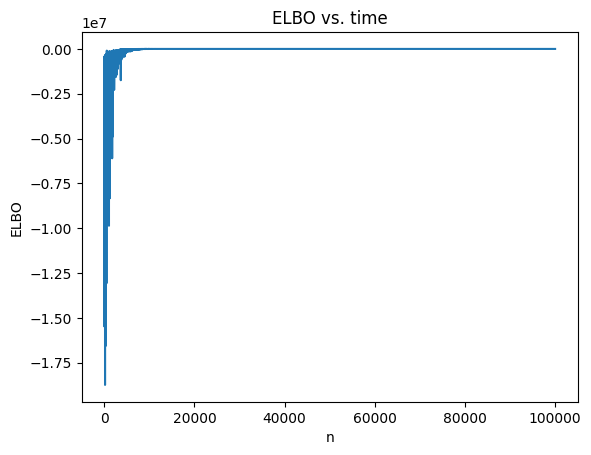

In [319]:
advi_elbo = pd.DataFrame(
    {'ELBO': -advi_fit.hist,
     'n': np.arange(advi_fit.hist.shape[0])})

plt.figure(dpi=100)
ax = sns.lineplot(y='ELBO', x='n', data=advi_elbo)
ax.set_title("ELBO vs. time")
plt.show()

<Axes: xlabel='log_salary / log_salary'>

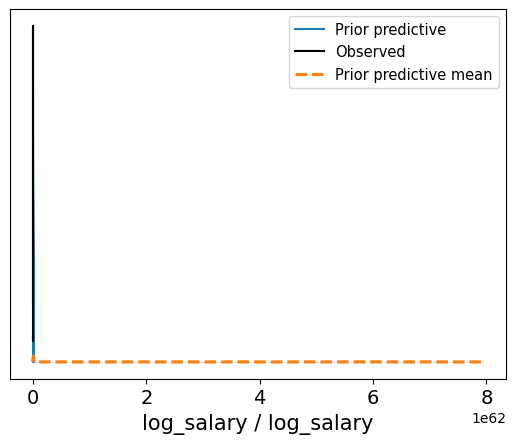

In [320]:
hier_keeper_priorp = pm.sample_prior_predictive(500, model = hier_keeper_model_2, return_inferencedata=True, random_seed=100)
az.plot_ppc(hier_keeper_priorp, group= "prior")

<Axes: xlabel='log_salary / log_salary'>

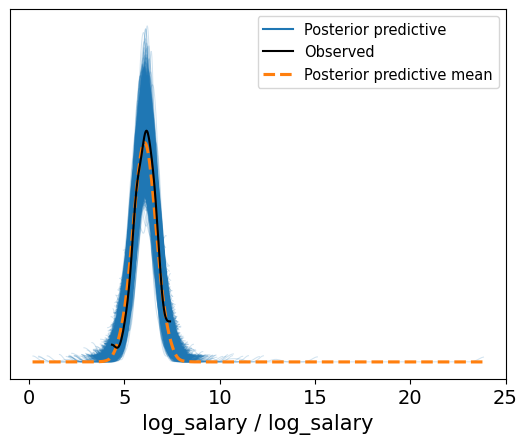

In [321]:
hier_keeper_pp = pm.sample_posterior_predictive(hier2_trace, model = hier_keeper_model_2, random_seed=100)
az.plot_ppc(hier_keeper_pp)

/usr/local/lib/python3.10/dist-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (100) is smaller than the number of variables to plot (269) in plot_posterior, generating only 100 plots
  warnings.warn(


array([[<Axes: title={'center': 'mu_0'}>,
        <Axes: title={'center': 'mu_5'}>,
        <Axes: title={'center': 'mu_6'}>,
        <Axes: title={'center': 'mu_7'}>],
       [<Axes: title={'center': 'mu_8'}>,
        <Axes: title={'center': 'mu_9'}>,
        <Axes: title={'center': 'mu_11'}>,
        <Axes: title={'center': 'mu_12'}>],
       [<Axes: title={'center': 'mu_14'}>,
        <Axes: title={'center': 'mu_15'}>,
        <Axes: title={'center': 'beta0\nLa Liga'}>,
        <Axes: title={'center': 'beta0\nLigue 1'}>],
       [<Axes: title={'center': 'beta0\nPremier League'}>,
        <Axes: title={'center': 'beta0\nSerie A'}>,
        <Axes: title={'center': 'beta0\nBundesliga'}>,
        <Axes: title={'center': 'beta_per90\nLa Liga'}>],
       [<Axes: title={'center': 'beta_per90\nLigue 1'}>,
        <Axes: title={'center': 'beta_per90\nPremier League'}>,
        <Axes: title={'center': 'beta_per90\nSerie A'}>,
        <Axes: title={'center': 'beta_per90\nBundesliga'}>],
      

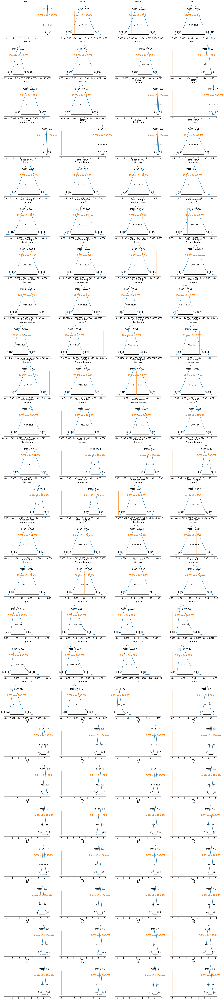

In [322]:
az.rcParams['plot.max_subplots'] = 100
az.plot_posterior(hier2_trace, ref_val = 0)

## Tuned Hierarchical Model

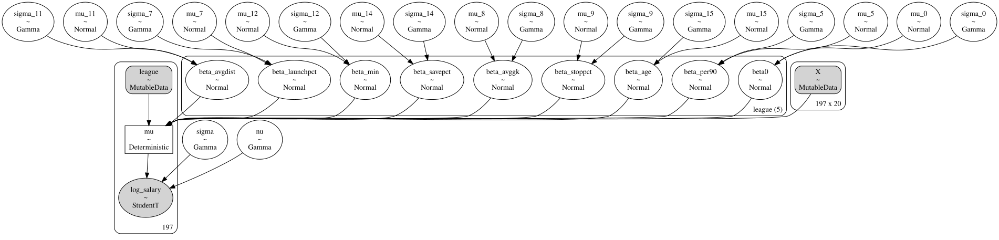

In [349]:
X = df.drop(columns = ['Annual Wages (USD)', 'Weekly Wages (USD)', 'Player', 'Squad', 'PSxG+/-', 'Opp', 'Thr', 'SoTA', 'Saves', 'GA'])
X = pd.get_dummies(X, columns = ['League'], dtype = float)
X = X.values
league, league_unique = df['League'].factorize()


coords = {'obs_id': df.index, 'league': league_unique}
with pm.Model(coords = coords) as hier_keeper_model_final:
    league = pm.MutableData("league", league)
    # hyperpriors
    mu_0 = pm.Normal('mu_0', mu = meany, sigma = 1)
    sigma_0 = pm.Gamma('sigma_0', .05 , 10)
    #mu_1 = pm.Normal('mu_1', mu = 0, sigma = 0.1)
    #sigma_1 = pm.Gamma('sigma_1', .05, 10)
    #mu_2 = pm.Normal('mu_2', mu = 0, sigma = 0.1)
    #sigma_2 = pm.Gamma('sigma_2', .05, 10)
    #mu_3 = pm.Normal('mu_3', mu = 0, sigma = 0.1)
    #sigma_3 = pm.Gamma('sigma_3',.05, 10)
    #mu_4 = pm.Normal('mu_4', mu = 0, sigma = 0.1)
    #sigma_4 = pm.Gamma('sigma_4', .05, 10)
    mu_5 = pm.Normal('mu_5', mu = 0, sigma = 0.1)
    sigma_5 = pm.Gamma('sigma_5', .05, 10)
    #mu_6 = pm.Normal('mu_6', mu = 0, sigma = 0.1)
    #sigma_6 = pm.Gamma('sigma_6',.05, 10)
    mu_7 = pm.Normal('mu_7', mu = 0, sigma = 0.1)
    sigma_7 = pm.Gamma('sigma_7', .05, 10)
    mu_8 = pm.Normal('mu_8', mu = 0, sigma = 0.1)
    sigma_8 = pm.Gamma('sigma_8', .05, 10)
    mu_9 = pm.Normal('mu_9', mu = 0, sigma = 0.1)
    sigma_9 = pm.Gamma('sigma_9', .05, 10)
    #mu_10 = pm.Normal('mu_10', mu = 0, sigma = 0.1)
    #sigma_10 = pm.Gamma('sigma_10', .05, 10)
    mu_11 = pm.Normal('mu_11', mu = 0, sigma = 0.1)
    sigma_11 = pm.Gamma('sigma_11', .05, 10)
    mu_12 = pm.Normal('mu_12', mu = 0, sigma = 0.1)
    sigma_12 = pm.Gamma('sigma_12', .05, 10)
    mu_14 = pm.Normal('mu_14', mu = 0, sigma = 0.1)
    sigma_14 = pm.Gamma('sigma_14', .05, 10)
    mu_15 = pm.Normal('mu_15', mu = 0, sigma = 0.1)
    sigma_15 = pm.Gamma('sigma_15', .05, 10)


    # priors
    beta0 = pm.Normal('beta0', mu=mu_0, sigma=sigma_0, dims = ('league'))
    #beta_PKA = pm.Normal('beta_PKA', mu=mu_1, sigma=sigma_1, dims = ('league'))
    #beta_FK = pm.Normal('beta_FK', mu=mu_2, sigma=sigma_2, dims = ('league'))
    #beta_CK = pm.Normal('beta_CK', mu=mu_3, sigma=sigma_3, dims = ('league'))
    #beta_OG = pm.Normal('beta_OG', mu=mu_4, sigma=sigma_4, dims = ('league'))
    beta_per90 = pm.Normal('beta_per90', mu=mu_5, sigma=sigma_5, dims = ('league'))
    #beta_comppct = pm.Normal('beta_comppct', mu=mu_6, sigma=sigma_6, dims = ('league'))
    beta_launchpct = pm.Normal('beta_launchpct', mu=mu_7, sigma=sigma_7, dims = ('league'))
    beta_avggk = pm.Normal('beta_avggk', mu=mu_8, sigma=sigma_8, dims = ('league'))
    beta_stoppct = pm.Normal('beta_stoppct', mu=mu_9, sigma=sigma_9, dims = ('league'))
    #beta_OPAper90 = pm.Normal('beta_OPAper90', mu=mu_10, sigma=sigma_10, dims = ('league'))
    beta_avgdist = pm.Normal('beta_avgdist', mu=mu_11, sigma=sigma_11, dims = ('league') )
    beta_min = pm.Normal('beta_min', mu=mu_12, sigma=sigma_12, dims = ('league'))
    #beta_GAper90 = pm.Normal('beta_GAper90', mu=mu_13, sigma=sigma_13, dims = ('league'))
    beta_savepct = pm.Normal('beta_savepct', mu=mu_14, sigma=sigma_14, dims = ('league'))
    beta_age = pm.Normal('beta_age', mu=mu_15, sigma=sigma_15, dims = ('league'))


    X = pm.MutableData('X', X)

    nu = pm.Gamma('nu', 6, 0.2)
    sigma = pm.Gamma('sigma', .5, 2)
    #sigma = pm.Uniform('sigma', 10**-5, 10)
    mu = pm.Deterministic("mu", beta0[league] + beta_per90[league]*X[:,4]
                         + beta_launchpct[league]*X[:,6] + beta_avggk[league]*X[:,7]+ beta_stoppct[league]*X[:,8] + beta_avgdist[league]*X[:,10] + beta_min[league]*X[:,11]+ beta_savepct[league]*X[:,13]+ beta_age[league]*X[:,14])

    log_salary = pm.StudentT('log_salary', mu = mu, sigma = sigma, observed = log_y, nu = nu)


    #trace = pm.sample(1000, tune=1000, return_inferencedata=True)
    advi_fit = pm.fit(100000, method='advi', random_seed = 100)
    advi_samples = 5000
    final_trace = advi_fit.sample(advi_samples, return_inferencedata=False)

    final_trace = pm.to_inference_data(trace=final_trace, model = hier_keeper_model_final, log_likelihood=True)


pm.model_to_graphviz(hier_keeper_model_final)

In [324]:
# with hier_keeper_model_final:
 #   final_trace=pm.sample(random_seed = 100, cores = 2, idata_kwargs={'log_likelihood':True}, return_inferencedata=True)
  #  az.plot_trace(final_trace, kind = "rank_bars")

In [325]:
#az.summary(final_trace)

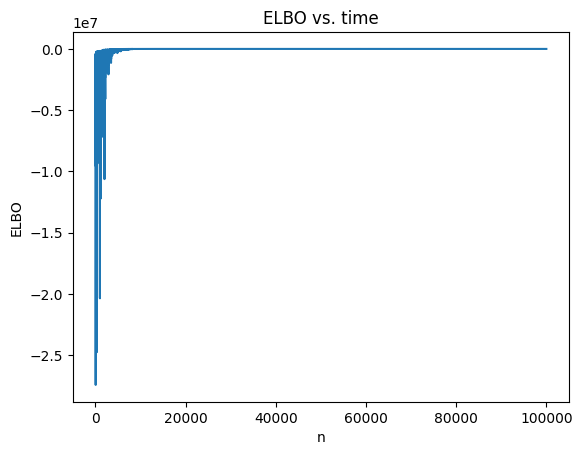

In [352]:
advi_elbo = pd.DataFrame(
    {'ELBO': -advi_fit.hist,
     'n': np.arange(advi_fit.hist.shape[0])})

plt.figure(dpi=100)
ax = sns.lineplot(y='ELBO', x='n', data=advi_elbo)
ax.set_title("ELBO vs. time")
plt.show()

<Axes: xlabel='log_salary / log_salary'>

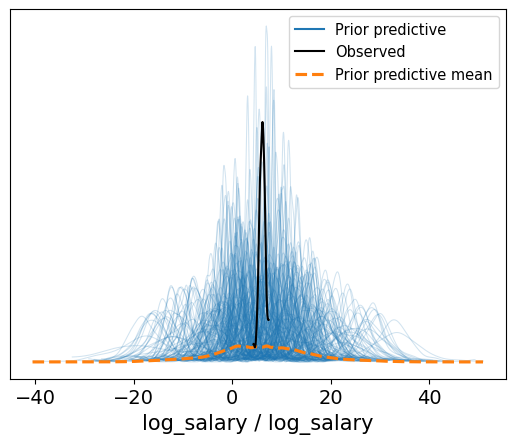

In [353]:
hier_keeper_priorp = pm.sample_prior_predictive(500, model = hier_keeper_model_final, return_inferencedata=True, random_seed=100)
az.plot_ppc(hier_keeper_priorp, group= "prior")

<Axes: xlabel='log_salary / log_salary'>

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


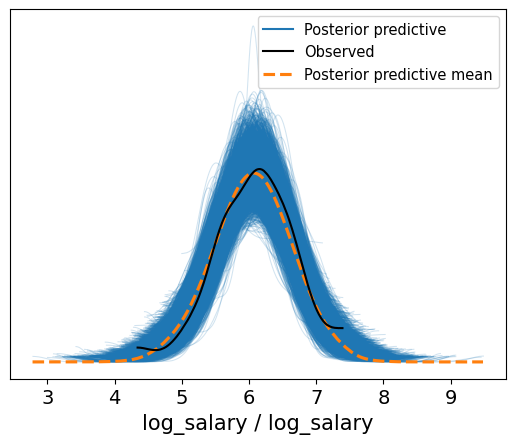

In [354]:
hier_keeper_pp = pm.sample_posterior_predictive(final_trace, model = hier_keeper_model_final, random_seed=100)
az.plot_ppc(hier_keeper_pp)

/usr/local/lib/python3.10/dist-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (100) is smaller than the number of variables to plot (262) in plot_posterior, generating only 100 plots
  warnings.warn(


array([[<Axes: title={'center': 'mu_0'}>,
        <Axes: title={'center': 'mu_5'}>,
        <Axes: title={'center': 'mu_7'}>,
        <Axes: title={'center': 'mu_8'}>],
       [<Axes: title={'center': 'mu_9'}>,
        <Axes: title={'center': 'mu_11'}>,
        <Axes: title={'center': 'mu_12'}>,
        <Axes: title={'center': 'mu_14'}>],
       [<Axes: title={'center': 'mu_15'}>,
        <Axes: title={'center': 'beta0\nLa Liga'}>,
        <Axes: title={'center': 'beta0\nLigue 1'}>,
        <Axes: title={'center': 'beta0\nPremier League'}>],
       [<Axes: title={'center': 'beta0\nSerie A'}>,
        <Axes: title={'center': 'beta0\nBundesliga'}>,
        <Axes: title={'center': 'beta_per90\nLa Liga'}>,
        <Axes: title={'center': 'beta_per90\nLigue 1'}>],
       [<Axes: title={'center': 'beta_per90\nPremier League'}>,
        <Axes: title={'center': 'beta_per90\nSerie A'}>,
        <Axes: title={'center': 'beta_per90\nBundesliga'}>,
        <Axes: title={'center': 'beta_launchpct\n

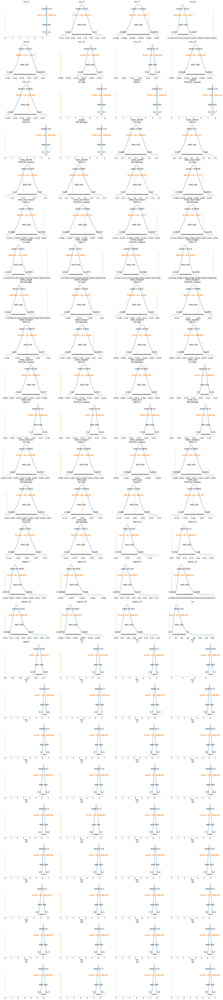

In [355]:
az.rcParams['plot.max_subplots'] = 100
az.plot_posterior(final_trace, ref_val = 0)

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

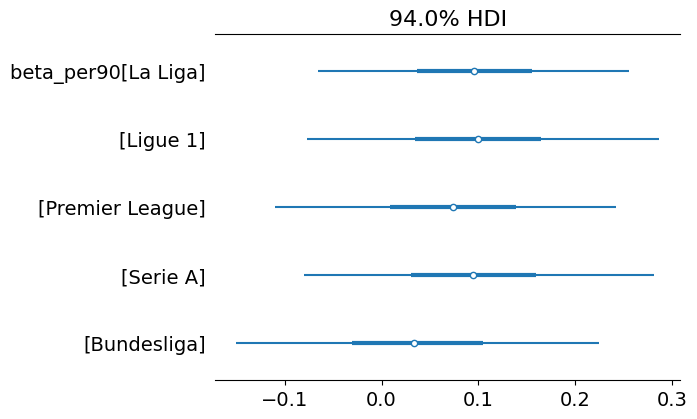

In [361]:
az.plot_forest(final_trace, var_names=[
'beta_per90'])


array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

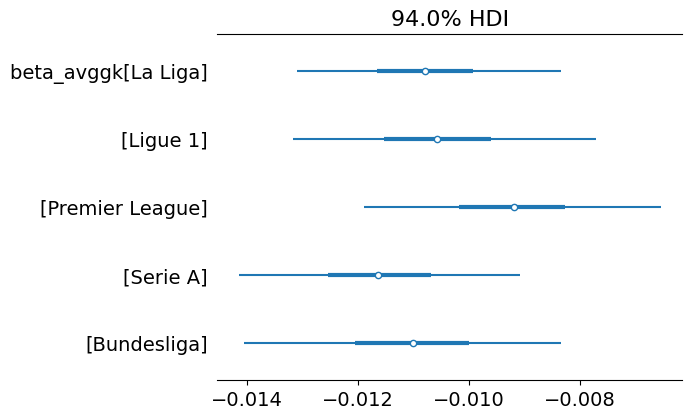

In [362]:
az.plot_forest(final_trace, var_names=[
'beta_avggk'])


array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

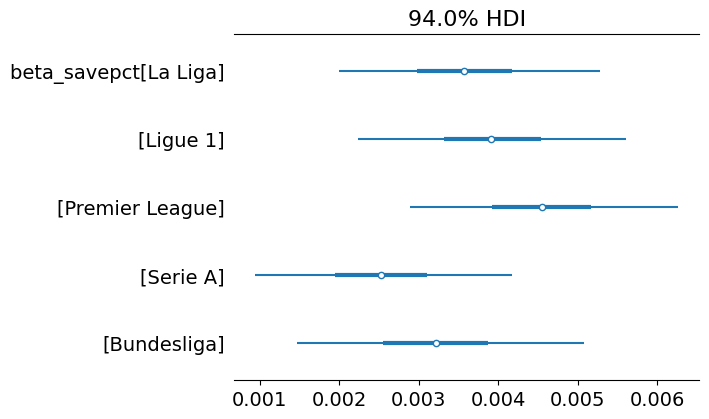

In [363]:
az.plot_forest(final_trace, var_names=[
'beta_savepct'])

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

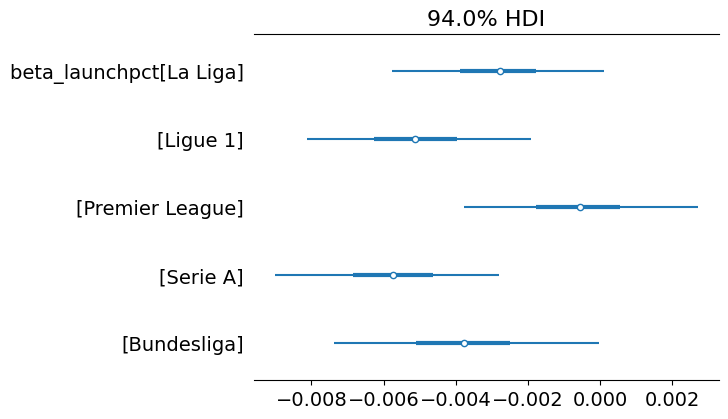

In [364]:
az.plot_forest(final_trace, var_names=[
'beta_launchpct'])

In [365]:
X = df.drop(columns = ['Annual Wages (USD)', 'Weekly Wages (USD)', 'Player', 'Squad', 'PSxG+/-', 'Opp', 'Thr', 'SoTA', 'Saves', 'GA'])
X = pd.get_dummies(X, columns = ['League'], dtype = float)
X = X.values

len(X.T)

20

In [379]:
df2 = df.copy()
df2['League'] = "La Liga"
counter_id, counter = df2['League'].factorize()
df.head(10)

,Player,GA,PKA,FK,CK,OG,PSxG+/-,/90,Cmp%,Thr,...,Min,GA90,SoTA,Saves,Save%,Squad,Weekly Wages (USD),Annual Wages (USD),League,Age
0,Julen Agirrezabala,6.0,0.0,0.0,0.0,0.0,-0.5,-0.06,36.6,33,...,2.829304,0.80,19.0,13.0,68.4,Athletic Club,8832,459253,La Liga,1.322219
1,Doğan Alemdar,8.0,1.0,0.0,2.0,0.0,-1.5,-0.32,34.3,14,...,2.608526,1.77,16.0,7.0,56.3,Rennes,2734,142150,Ligue 1,1.278754
2,Alisson,43.0,2.0,0.0,0.0,2.0,10.1,0.27,41.0,210,...,3.522444,1.16,147.0,105.0,72.1,Liverpool,190651,9913856,Premier League,1.462398
3,Alphonse Areola,7.0,2.0,0.0,1.0,0.0,0.3,0.09,37.8,14,...,2.489958,2.04,16.0,9.0,68.8,West Ham,152521,7931085,Premier League,1.462398
4,Kepa Arrizabalaga,33.0,1.0,1.0,4.0,3.0,5.0,0.18,31.9,151,...,3.409087,1.16,120.0,90.0,73.3,Chelsea,190651,9913856,Premier League,1.431364
5,Sergio Asenjo,21.0,1.0,1.0,0.0,0.0,-4.2,-0.42,35.8,46,...,2.954243,2.10,51.0,30.0,60.8,Valladolid,21869,1137199,La Liga,1.518514
6,Emil Audero,39.0,5.0,0.0,4.0,2.0,-4.7,-0.19,36.1,104,...,3.352183,1.56,121.0,82.0,71.9,Sampdoria,31122,1618322,Serie A,1.397940
7,Édgar Badía,63.0,7.0,0.0,4.0,2.0,8.5,0.24,45.3,166,...,3.510545,1.75,200.0,136.0,72.0,Elche,13668,710749,La Liga,1.477121
8,Oliver Baumann,57.0,2.0,1.0,11.0,1.0,-5.6,-0.16,39.2,168,...,3.485721,1.68,161.0,105.0,65.8,Hoffenheim,66238,3444401,Bundesliga,1.505150
9,Gavin Bazunu,56.0,1.0,1.0,7.0,4.0,-16.6,-0.52,33.7,144,...,3.459392,1.75,120.0,67.0,54.2,Southampton,25420,1321847,Premier League,1.301030


In [389]:
#new_x = np.ma.zeros((200,15))
#new_x[:,11]= np.linspace(-2,2, num = 200)
counter_id = np.ones((197,))*0
counter_id = (counter_id).astype(int)
X = df.drop(columns = ['Annual Wages (USD)', 'Weekly Wages (USD)', 'Player', 'Squad', 'PSxG+/-', 'Opp', 'Thr', 'SoTA', 'Saves', 'GA'])
X = pd.get_dummies(X, columns = ['League'], dtype = float)
X = X.values


new_savepct = np.linspace(0,100, num = 197)

X_counter = np.zeros((197, len(X.T)))

for i in range(len(X.T)-5):
  X_counter[:, i] = np.mean(X[:, i])

X_counter[:,13] = new_savepct
X_counter[:, 16] = np.ones((197, ))

with hier_keeper_model_final:
# update values of predictors:
  pm.set_data({"X": X_counter,
               "league": counter_id})
# use the updated values and predict outcomes and probabilities:
  gk_pp_pred = pm.sample_posterior_predictive(
    final_trace,
    var_names=["mu"],
    return_inferencedata=True,
    predictions=True,
    #extend_inferencedata=True,
    random_seed=100,
)


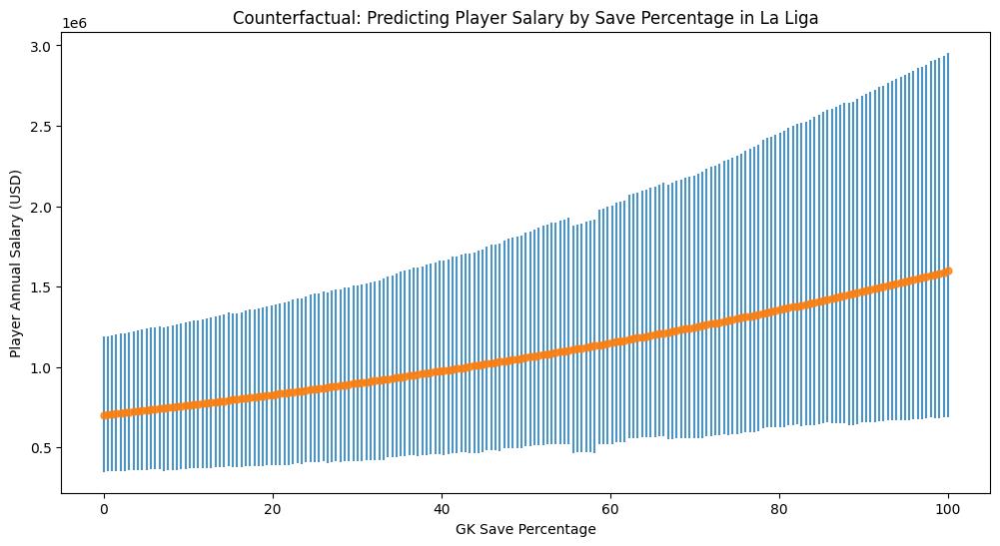

In [390]:
_, ax = plt.subplots(figsize=(12, 6))
preds_counterfactual = gk_pp_pred.predictions_constant_data["X"][:,13]
model_preds = gk_pp_pred.predictions


ax.vlines(
preds_counterfactual,
*az.hdi(10**model_preds)["mu"].transpose("hdi", ...),
alpha=0.8,
)
ax.set_title('Counterfactual: Predicting Player Salary by Save Percentage in La Liga')
ax.set_xlabel('GK Save Percentage')
ax.set_ylabel('Player Annual Salary (USD)')

ax.plot(
preds_counterfactual,
10**model_preds["mu"].mean(("chain", "draw")),
"o",
ms=5,
color="C1",
alpha=0.8,
)


array([0, 1, 2, 2, 2, 0, 3, 0, 4, 2, 2, 2, 1, 1, 1, 4, 1, 0, 0, 4, 1, 0,
       3, 1, 4, 3, 1, 4, 3, 1, 0, 3, 4, 1, 3, 1, 0, 1, 1, 0, 1, 3, 2, 1,
       2, 4, 2, 4, 3, 0, 0, 0, 3, 4, 1, 2, 1, 0, 0, 2, 4, 0, 3, 0, 0, 4,
       2, 4, 3, 2, 2, 0, 4, 2, 1, 2, 0, 1, 2, 4, 4, 1, 1, 0, 1, 0, 2, 1,
       1, 1, 2, 1, 0, 1, 0, 4, 3, 0, 1, 1, 0, 3, 0, 2, 0, 2, 2, 3, 2, 4,
       3, 3, 4, 3, 1, 2, 1, 2, 4, 1, 4, 0, 3, 4, 2, 4, 1, 3, 2, 0, 3, 4,
       3, 0, 4, 1, 3, 3, 3, 2, 2, 3, 1, 3, 1, 0, 4, 2, 3, 2, 0, 0, 4, 1,
       2, 2, 0, 0, 3, 4, 2, 1, 2, 3, 1, 4, 4, 1, 3, 0, 3, 0, 4, 3, 3, 1,
       4, 0, 3, 2, 3, 3, 3, 0, 3, 4, 2, 3, 4, 3, 0, 2, 0, 4, 4, 3, 3])

In [380]:
counter_id = np.ones((197,))
counter_id = (counter_id).astype(int)
#new_x = np.ma.zeros((200,15))
#new_x[:,11]= np.linspace(-2,2, num = 200)
X = df.drop(columns = ['Annual Wages (USD)', 'Weekly Wages (USD)', 'Player', 'Squad', 'PSxG+/-', 'Opp', 'Thr', 'SoTA', 'Saves', 'GA'])
X = pd.get_dummies(X, columns = ['League'], dtype = float)
X = X.values


new_savepct = np.linspace(0,100, num = 197)

X_counter = np.zeros((197, len(X.T)))

for i in range(len(X.T)-5):
  X_counter[:, i] = np.mean(X[:, i])

X_counter[:,13] = new_savepct
X_counter[:, 16] = np.ones((197, ))

with hier_keeper_model_final:
# update values of predictors:
  pm.set_data({"X": X_counter,
               "league": counter_id})
# use the updated values and predict outcomes and probabilities:
  gk_pp_pred = pm.sample_posterior_predictive(
    final_trace,
    var_names=["mu"],
    return_inferencedata=True,
    predictions=True,
    #extend_inferencedata=True,
    random_seed=100,
)


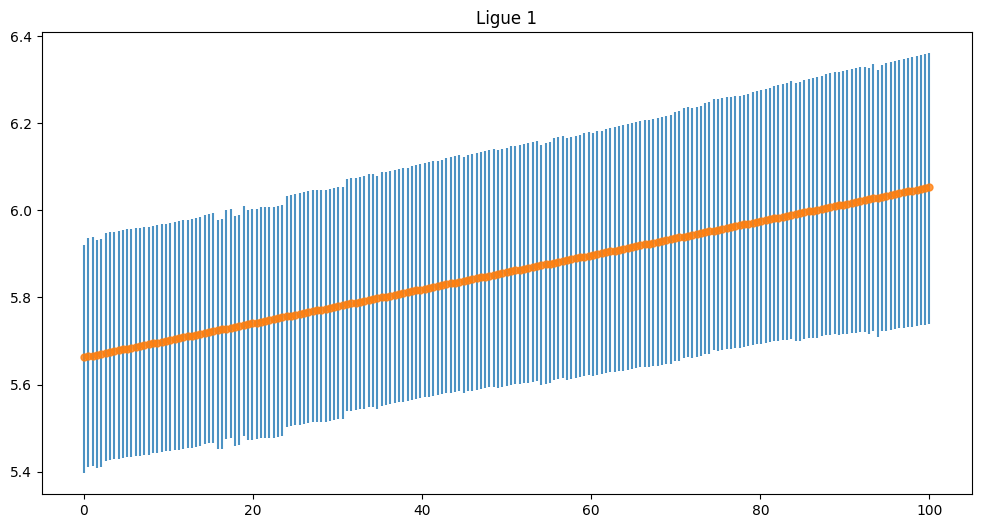

In [381]:
_, ax = plt.subplots(figsize=(12, 6))
preds_counterfactual = gk_pp_pred.predictions_constant_data["X"][:,13]
model_preds = gk_pp_pred.predictions


ax.vlines(
preds_counterfactual,
*az.hdi(model_preds)["mu"].transpose("hdi", ...),
alpha=0.8,
)

ax.set_title('Ligue 1')

ax.plot(
preds_counterfactual,
model_preds["mu"].mean(("chain", "draw")),
"o",
ms=5,
color="C1",
alpha=0.8,
)


In [382]:
#new_x = np.ma.zeros((200,15))
#new_x[:,11]= np.linspace(-2,2, num = 200)
counter_id = np.ones((197,))*2
counter_id = (counter_id).astype(int)
X = df.drop(columns = ['Annual Wages (USD)', 'Weekly Wages (USD)', 'Player', 'Squad', 'PSxG+/-', 'Opp', 'Thr', 'SoTA', 'Saves', 'GA'])
X = pd.get_dummies(X, columns = ['League'], dtype = float)
X = X.values


new_savepct = np.linspace(0,100, num = 197)

X_counter = np.zeros((197, len(X.T)))

for i in range(len(X.T)-5):
  X_counter[:, i] = np.mean(X[:, i])

X_counter[:,13] = new_savepct
X_counter[:, 16] = np.ones((197, ))

with hier_keeper_model_final:
# update values of predictors:
  pm.set_data({"X": X_counter,
               "league": counter_id})
# use the updated values and predict outcomes and probabilities:
  gk_pp_pred = pm.sample_posterior_predictive(
    final_trace,
    var_names=["mu"],
    return_inferencedata=True,
    predictions=True,
    #extend_inferencedata=True,
    random_seed=100,
)


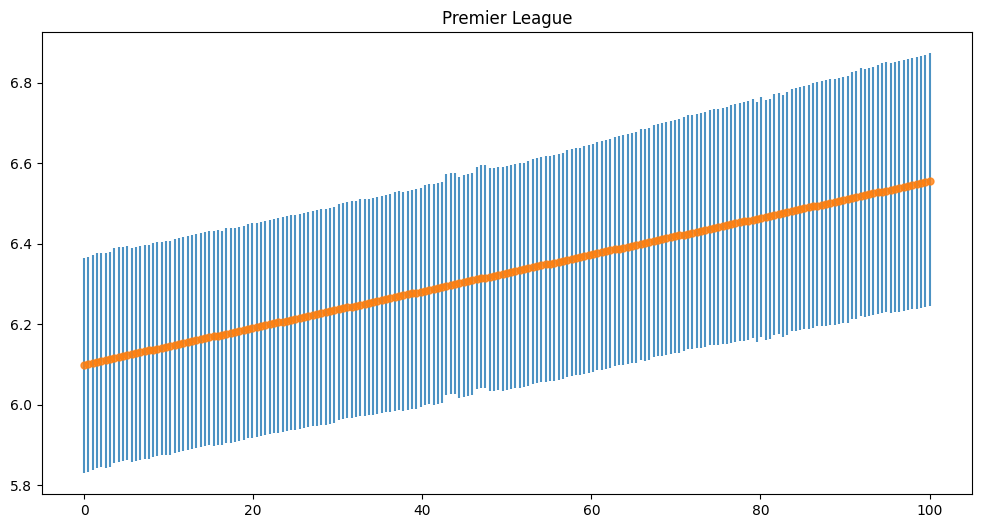

In [383]:
_, ax = plt.subplots(figsize=(12, 6))
preds_counterfactual = gk_pp_pred.predictions_constant_data["X"][:,13]
model_preds = gk_pp_pred.predictions


ax.vlines(
preds_counterfactual,
*az.hdi(model_preds)["mu"].transpose("hdi", ...),
alpha=0.8,
)

ax.set_title('Premier League')

ax.plot(
preds_counterfactual,
model_preds["mu"].mean(("chain", "draw")),
"o",
ms=5,
color="C1",
alpha=0.8,
)


In [384]:
#new_x = np.ma.zeros((200,15))
#new_x[:,11]= np.linspace(-2,2, num = 200)
counter_id = np.ones((197,))*3
counter_id = (counter_id).astype(int)
X = df.drop(columns = ['Annual Wages (USD)', 'Weekly Wages (USD)', 'Player', 'Squad', 'PSxG+/-', 'Opp', 'Thr', 'SoTA', 'Saves', 'GA'])
X = pd.get_dummies(X, columns = ['League'], dtype = float)
X = X.values


new_savepct = np.linspace(0,100, num = 197)

X_counter = np.zeros((197, len(X.T)))

for i in range(len(X.T)-5):
  X_counter[:, i] = np.mean(X[:, i])

X_counter[:,13] = new_savepct
X_counter[:, 16] = np.ones((197, ))

with hier_keeper_model_final:
# update values of predictors:
  pm.set_data({"X": X_counter,
               "league": counter_id})
# use the updated values and predict outcomes and probabilities:
  gk_pp_pred = pm.sample_posterior_predictive(
    final_trace,
    var_names=["mu"],
    return_inferencedata=True,
    predictions=True,
    #extend_inferencedata=True,
    random_seed=100,
)


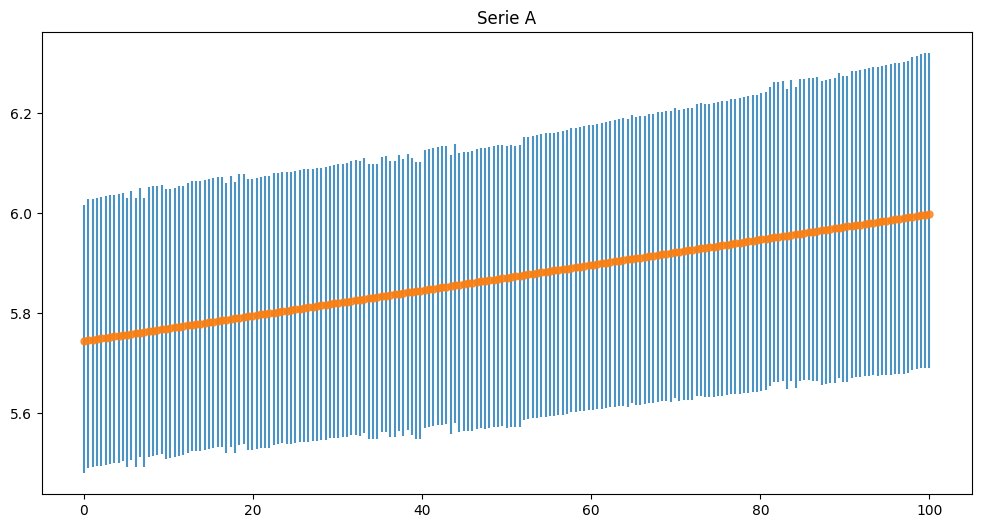

In [385]:
_, ax = plt.subplots(figsize=(12, 6))
preds_counterfactual = gk_pp_pred.predictions_constant_data["X"][:,13]
model_preds = gk_pp_pred.predictions


ax.vlines(
preds_counterfactual,
*az.hdi(model_preds)["mu"].transpose("hdi", ...),
alpha=0.8,
)
ax.set_title('Serie A')

ax.plot(
preds_counterfactual,
model_preds["mu"].mean(("chain", "draw")),
"o",
ms=5,
color="C1",
alpha=0.8,
)


In [386]:
#new_x = np.ma.zeros((200,15))
#new_x[:,11]= np.linspace(-2,2, num = 200)
counter_id = np.ones((197,))*4
counter_id = (counter_id).astype(int)
X = df.drop(columns = ['Annual Wages (USD)', 'Weekly Wages (USD)', 'Player', 'Squad', 'PSxG+/-', 'Opp', 'Thr', 'SoTA', 'Saves', 'GA'])
X = pd.get_dummies(X, columns = ['League'], dtype = float)
X = X.values


new_savepct = np.linspace(0,100, num = 197)

X_counter = np.zeros((197, len(X.T)))

for i in range(len(X.T)-5):
  X_counter[:, i] = np.mean(X[:, i])

X_counter[:,13] = new_savepct
X_counter[:, 16] = np.ones((197, ))

with hier_keeper_model_final:
# update values of predictors:
  pm.set_data({"X": X_counter,
               "league": counter_id})
# use the updated values and predict outcomes and probabilities:
  gk_pp_pred = pm.sample_posterior_predictive(
    final_trace,
    var_names=["mu"],
    return_inferencedata=True,
    predictions=True,
    #extend_inferencedata=True,
    random_seed=100,
)


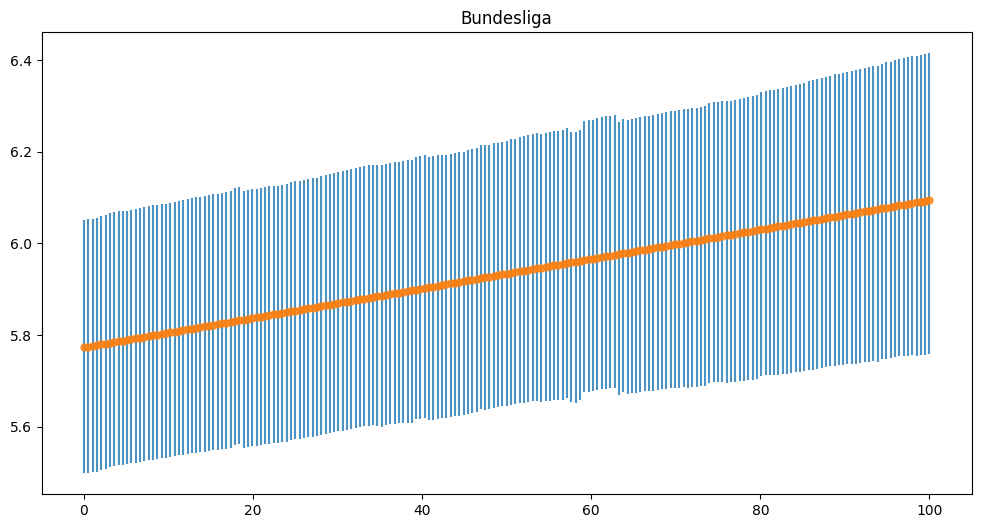

In [387]:
_, ax = plt.subplots(figsize=(12, 6))
preds_counterfactual = gk_pp_pred.predictions_constant_data["X"][:,13]
model_preds = gk_pp_pred.predictions


ax.vlines(
preds_counterfactual,
*az.hdi(model_preds)["mu"].transpose("hdi", ...),
alpha=0.8,
)

ax.set_title('Bundesliga')
ax.plot(
preds_counterfactual,
model_preds["mu"].mean(("chain", "draw")),
"o",
ms=5,
color="C1",
alpha=0.8,
)


In [350]:
az.compare({'pooled': pooled1_trace, 'unpooled': unpooled1_trace, 'hierarchical': hier1_trace, 'transformed pooled': pooled2_trace, 'transformed unpooled': unpooled2_trace, 'transformed hierarchical': hier2_trace, 'final hierarchical':final_trace}, ic = 'loo')

/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
final hierarchical,0,-143.606738,26.779333,0.000000,0.472657,10.960472,0.000000,False,log
transformed hierarchical,1,-143.984487,28.477024,0.377749,0.470182,11.324937,3.058016,False,log
transformed pooled,2,-160.819378,10.306646,17.212640,0.057161,10.188509,6.334707,False,log
transformed unpooled,3,-181.444345,39.975243,37.837607,0.000000,11.442327,6.950864,False,log
pooled,4,-199.027821,15.115767,55.421083,0.000000,9.184417,9.079414,False,log
unpooled,5,-213.710651,39.464719,70.103913,0.000000,8.037669,9.642567,True,log
hierarchical,6,-215.763547,44.944755,72.156809,0.000000,10.040264,10.684653,True,log


In [351]:
az.compare({'pooled': pooled1_trace, 'unpooled': unpooled1_trace, 'hierarchical': hier1_trace, 'transformed pooled': pooled2_trace, 'transformed unpooled': unpooled2_trace, 'transformed hierarchical': hier2_trace, 'final hierarchical':final_trace}, ic = 'waic')

/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the

,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
final hierarchical,0,-143.021913,26.194508,0.000000,4.774184e-01,10.893758,0.000000,True,log
transformed hierarchical,1,-143.256935,27.749472,0.235022,4.808370e-01,11.202905,3.013484,True,log
transformed pooled,2,-160.759736,10.247004,17.737823,4.174463e-02,10.180269,6.302330,True,log
transformed unpooled,3,-180.057684,38.588583,37.035771,4.977325e-12,11.286910,6.863412,True,log
pooled,4,-198.829777,14.917723,55.807864,2.541507e-12,9.159158,9.029762,True,log
unpooled,5,-211.434336,37.188405,68.412423,1.014592e-12,7.808487,9.511394,True,log
hierarchical,6,-212.710311,41.891519,69.688398,0.000000e+00,9.696444,10.381803,True,log
